##### imports

# To-Do:
- different/heavier models
    - ResNet50V2
    - DenseNet169
    - EfficientNetV2B1
- XAI

In [2]:
import tensorflow as tf
import keras
from keras.saving import load_model
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from keras.applications import MobileNetV2,ResNet50V2,DenseNet169,EfficientNetV2B1
from keras import layers,models
from tensorflow import data as tf_data
import os
import random
import zipfile
import shutil
import pandas as pd
from sklearn.metrics import (roc_curve, roc_auc_score, confusion_matrix,
                             ConfusionMatrixDisplay,classification_report)
import reload_data2
#from google.colab import drive
#drive.mount(' /content/drive')
import random
from PIL import Image
from tqdm import tqdm
from concurrent.futures import ProcessPoolExecutor
import Handwriting_XAI2 as xai

In [4]:
def process_image(args):
    img_path, output_path, target_size = args

    with Image.open(img_path) as img:
        img = img.convert("RGB")
        w, h = img.size

        if h > w:
            # Tall image → crop from bottom
            img = img.crop((0, 0, w, w))   # keep top square
            squared_img = img

        else:
            # Wide image → pad normally
            max_dim = max(w, h)

            squared_img = Image.new("RGB", (max_dim, max_dim), (255,255,255))
            squared_img.paste(img, (0,0))

        if target_size:
            squared_img = squared_img.resize(target_size, Image.LANCZOS)

        squared_img.save(output_path)

def process_dataset(input_root, output_root, target_size=None, workers=8):

    tasks = []

    for split in ["train", "val", "test"]:
        split_path = os.path.join(input_root, split)

        for class_name in os.listdir(split_path):

            class_path = os.path.join(split_path, class_name)
            if not os.path.isdir(class_path):
                continue

            output_class_path = os.path.join(output_root, split, class_name)
            os.makedirs(output_class_path, exist_ok=True)

            for img_name in os.listdir(class_path):
                if img_name.lower().endswith(('.png','.jpg','.jpeg')):

                    img_path = os.path.join(class_path, img_name)
                    output_path = os.path.join(output_class_path, img_name)

                    tasks.append((img_path, output_path, target_size))

    with ProcessPoolExecutor(max_workers=workers) as executor:
        list(tqdm(executor.map(process_image, tasks), total=len(tasks)))

## Data Loading

In [5]:
df = pd.read_csv("/content/Handwriting_Metadata_clean.csv")
df=df.sort_values(by="wid").reset_index(drop=True)
df.head(5)

,wid,agegroup,gender,handedness
0,w0001,25-40,female,right
1,w0002,41-60,male,right
2,w0003,25-40,female,right
3,w0004,18-24,female,ambidextrous
4,w0005,18-24,male,right


In [6]:
IMAGE_SIZE = (384,384)
BATCH_SIZE = 64
INPUT_SHAPE = IMAGE_SIZE + (3,)
NUM_CLASSES = 90

In [6]:
! unzip -q /content/Handwriting_Images_90sorted.zip

In [7]:
! rm -dr __MACOSX

In [7]:
drive_dir="/content/drive/MyDrive/CSAFE_zips"
data_dir = "/content/Handwriting_Images"

In [9]:
reload_data2.stratify_split_alt(data_dir)

Using 90 class labels


In [10]:
reload_data2.del_old_writer_directories(data_dir)

In [11]:
new_data_dir="New_Data"
os.mkdir(new_data_dir)

%time
process_dataset(data_dir, new_data_dir, target_size=IMAGE_SIZE)

CPU times: user 4 µs, sys: 0 ns, total: 4 µs
Wall time: 7.63 µs


100%|██████████| 2430/2430 [00:57<00:00, 41.91it/s]


In [13]:
train_ds,val_ds,test_ds=reload_data2.train_val_test_split(new_data_dir,IMAGE_SIZE,BATCH_SIZE)

Found 1350 files belonging to 90 classes.
Found 540 files belonging to 90 classes.
Found 540 files belonging to 90 classes.


In [ ]:
#save test dataset
#! zip -rq ResNet_90_test.zip /content/New_Data/tes

# Modelling

## ResNet50V2

In [13]:
base_model = ResNet50V2(
    include_top = False,
    classifier_activation="softmax",
    weights = "imagenet",
    input_shape=(IMAGE_SIZE + (3,))
    )

def make_transfer_model(base_model, input_shape, num_classes, name):
    backbone = base_model

    backbone.trainable = False

    inputs = layers.Input(input_shape)
    x = keras.applications.resnet50.preprocess_input(inputs)
    x = backbone(x)
    x = layers.Dropout(0.3)(x)

    x = layers.GlobalAveragePooling2D()(x)

    x = layers.Dropout(0.25)(x)
    outputs = layers.Dense(num_classes, activation=None)(x)

    return keras.Model(inputs, outputs, name=name)




model = make_transfer_model(base_model,INPUT_SHAPE,NUM_CLASSES,"ResNet_90")

model.summary()

94668760/94668760 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "ResNet_90"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 384, 384)  │          0 │ input_layer_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 384, 384)  │          0 │ input_layer_1[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 384, 384)  │          0 │ input_layer_1[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 384, 384,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 384, 384,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50v2          │ (None, 12, 12,    │ 23,564,800 │ add[0][0]         │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 12, 12,    │          0 │ resnet50v2[0][0]  │
│                     │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ dropout[0][0]     │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 2048)      │          0 │ global_average_p… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 90)        │    184,410 │ dropout_1[0][0]   │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 23,749,210 (90.60 MB)

 Trainable params: 184,410 (720.35 KB)

 Non-trainable params: 23,564,800 (89.89 MB)

In [14]:
model.get_layer("resnet50v2").summary()

Model: "resnet50v2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 390, 390,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 192, 192,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 194, 194,  │          0 │ conv1_conv[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 96, 96,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 96, 96,    │        256 │ pool1_pool[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_preac… │ (None, 96, 96,    │          0 │ conv2_block1_pre… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 96, 96,    │      4,096 │ conv2_block1_pre… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 96, 96,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 96, 96,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_pad  │ (None, 98, 98,    │          0 │ conv2_block1_1_r… │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 96, 96,    │     36,864 │ conv2_block1_2_p… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 96, 96,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 96, 96,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 96, 96,    │     16,640 │ conv2_block1_pre… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 96, 96,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_out    │ (None, 96, 96,    │          0 │ conv2_block1_0_c

 Total params: 23,564,800 (89.89 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,564,800 (89.89 MB)

### epochs

In [15]:
%%time

epochs = 100

model.compile(
    optimizer= "adam",
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True), ###make sure is true
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc"),
             keras.metrics.SparseTopKCategoricalAccuracy(k=3, name="top3_acc")],
    )

history = model.fit(
    train_ds,
    epochs= epochs,
    validation_data= val_ds)

model.save("ResNet_90.keras")

#save metrics
lossacc = pd.DataFrame(history.history)
lossacc.to_csv(f"ResNet_90_lossacc.csv")

Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 41s 1s/step - acc: 0.0119 - loss: 199.8413 - top3_acc: 0.0393 - val_acc: 0.0148 - val_loss: 79.0303 - val_top3_acc: 0.0426
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - acc: 0.0148 - loss: 162.8789 - top3_acc: 0.0385 - val_acc: 0.0463 - val_loss: 58.9987 - val_top3_acc: 0.0741
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 72ms/step - acc: 0.0111 - loss: 140.1734 - top3_acc: 0.0437 - val_acc: 0.0241 - val_loss: 54.5766 - val_top3_acc: 0.0704
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - acc: 0.0200 - loss: 135.0418 - top3_acc: 0.0593 - val_acc: 0.0389 - val_loss: 55.1635 - val_top3_acc: 0.0870
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - acc: 0.0200 - loss: 126.4421 - top3_acc: 0.0548 - val_acc: 0.0352 - val_loss: 56.8160 - val_top3_acc: 0.0796
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 71ms/step - acc: 0.0222 - loss: 123.2214 - top3_acc: 0.0563 - val_acc: 0.0444 - val_loss: 45.4585 - val_top3_acc: 0.1333
Epoch 7/100
22/22 ━━━━━

    plateauing at ~15%?

### Visualization

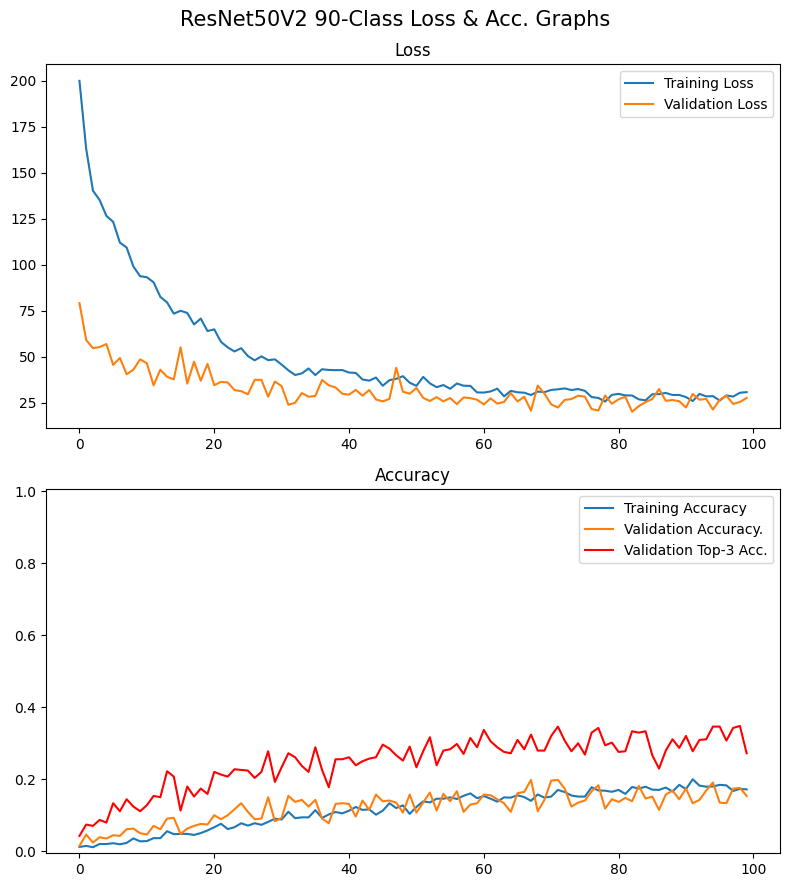

In [16]:
plt.figure(figsize=(8,9))
plt.suptitle("ResNet50V2 90-Class Loss & Acc. Graphs",size=15)

plt.subplot(2,1,1)
plt.plot(range(len(history.history["loss"])),history.history["loss"],label="Training Loss")
plt.plot(range(len(history.history["val_loss"])),history.history["val_loss"],label="Validation Loss")
plt.title("Loss")
plt.legend()

plt.subplot(2,1,2)
plt.plot(range(len(history.history["acc"])),history.history["acc"],label="Training Accuracy")
plt.plot(range(len(history.history["val_acc"])),history.history["val_acc"],label="Validation Accuracy.")
plt.plot(range(len(history.history["val_top3_acc"])),history.history["val_top3_acc"],label="Validation Top-3 Acc.",color="red")
plt.title("Accuracy")
bottom,top=plt.ylim()
plt.ylim(bottom,1-bottom)
plt.legend()

plt.tight_layout()
plt.show()

### Test Set

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step - acc: 0.1648 - loss: 27.0882 - top3_acc: 0.3037
{'acc': 0.1648148149251938, 'loss': 27.088178634643555, 'top3_acc': 0.3037036955356598}

2/2 ━━━━━━━━━━━━━━━━━━━━ 9s 54ms/step


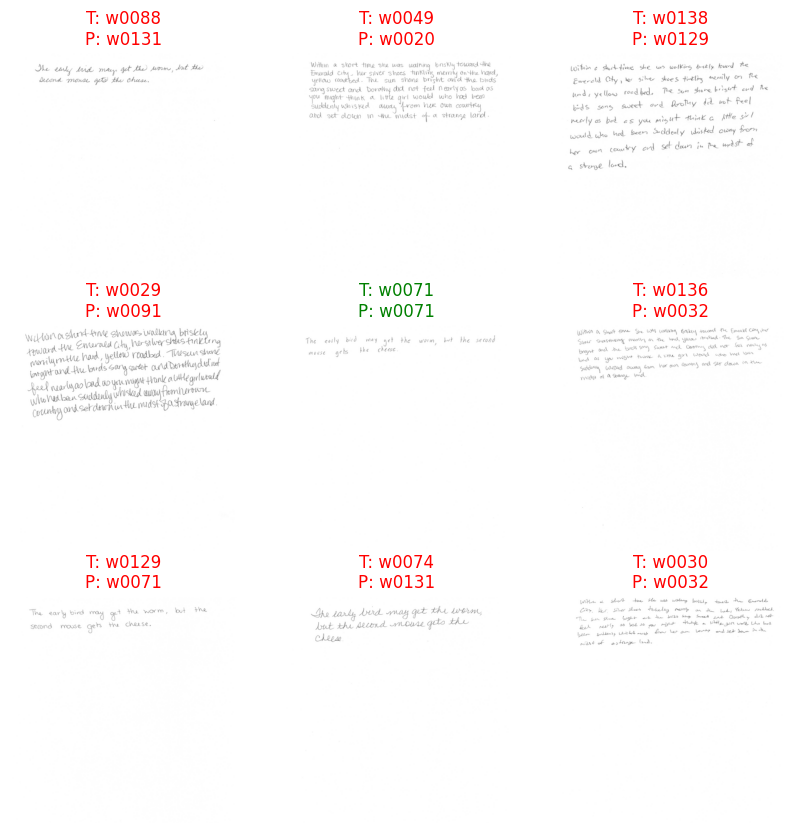

In [17]:
results = model.evaluate(test_ds, return_dict=True)

print(results)
print()

reload_data2.show_testpreds(test_ds,model)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


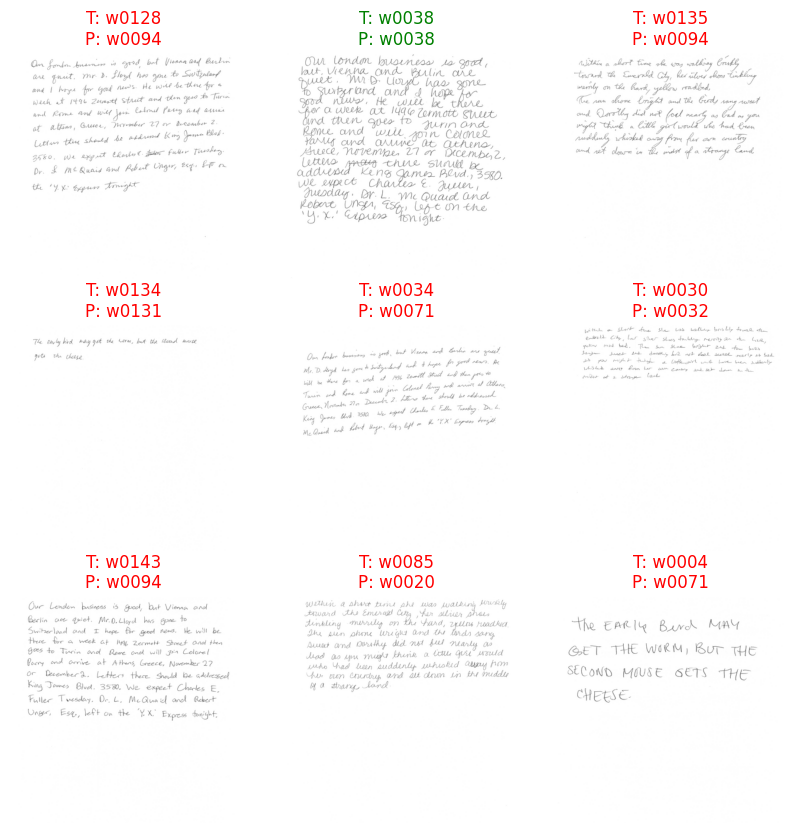

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


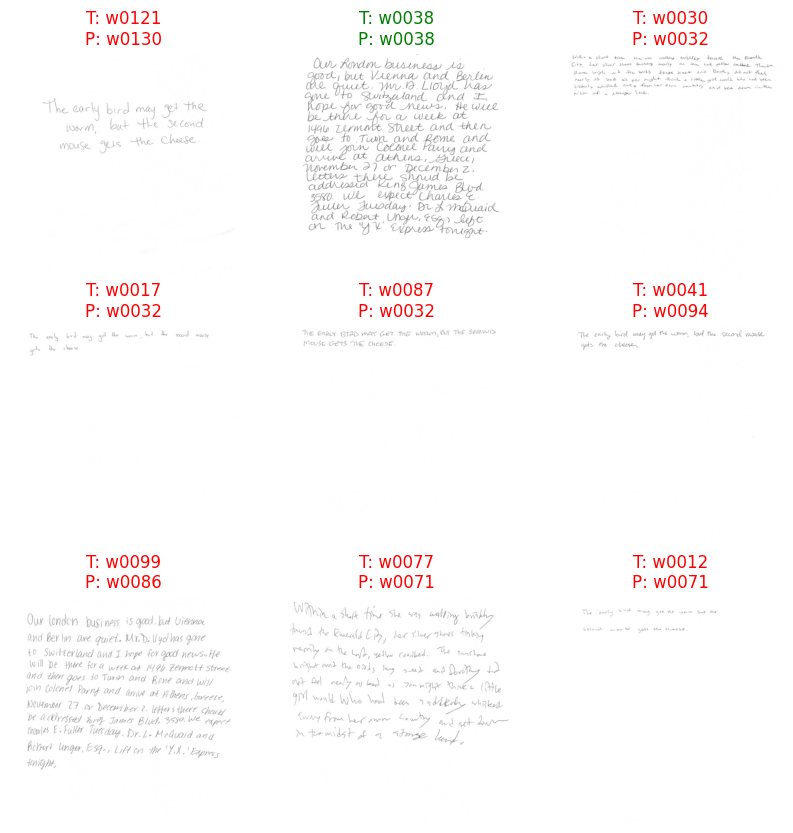

In [21]:
reload_data2.show_testpreds(test_ds,model)
reload_data2.show_testpreds(test_ds,model)

### XAI

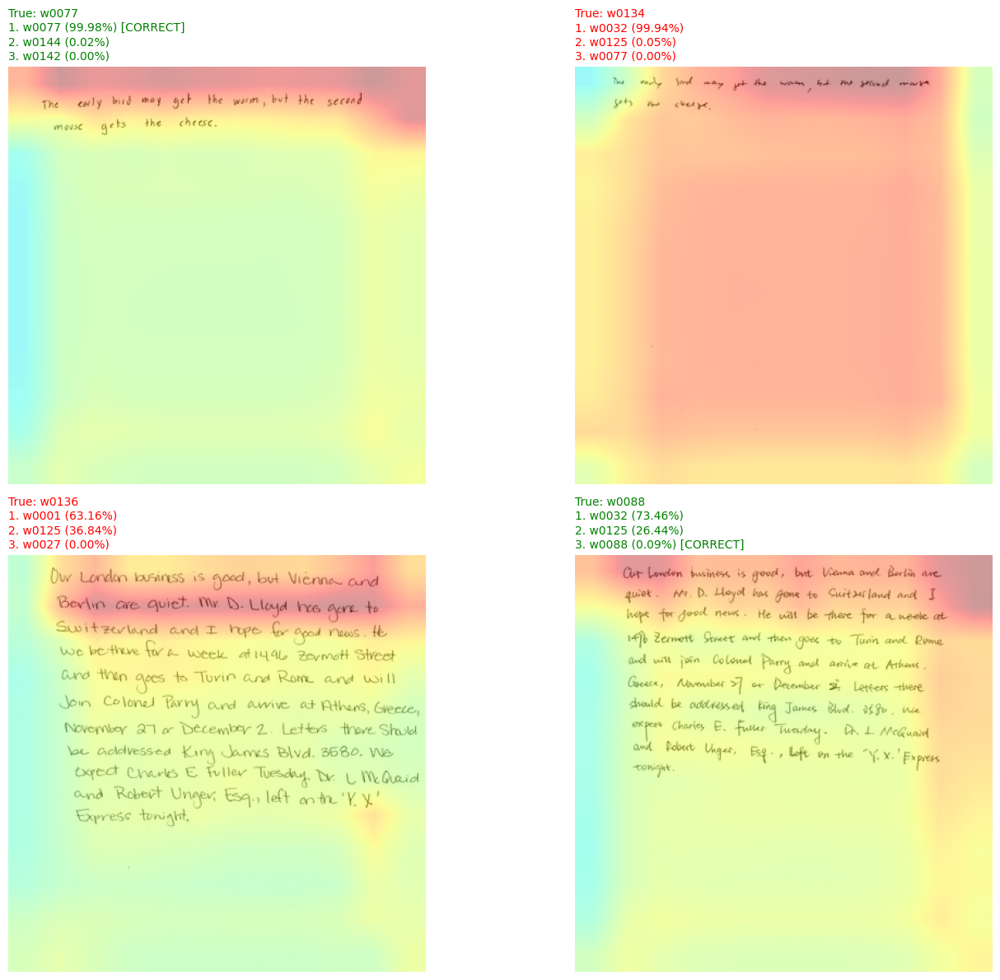

CPU times: user 8.8 s, sys: 379 ms, total: 9.18 s
Wall time: 9.49 s


In [19]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="post_relu", n=4)

    too "hot" ^^

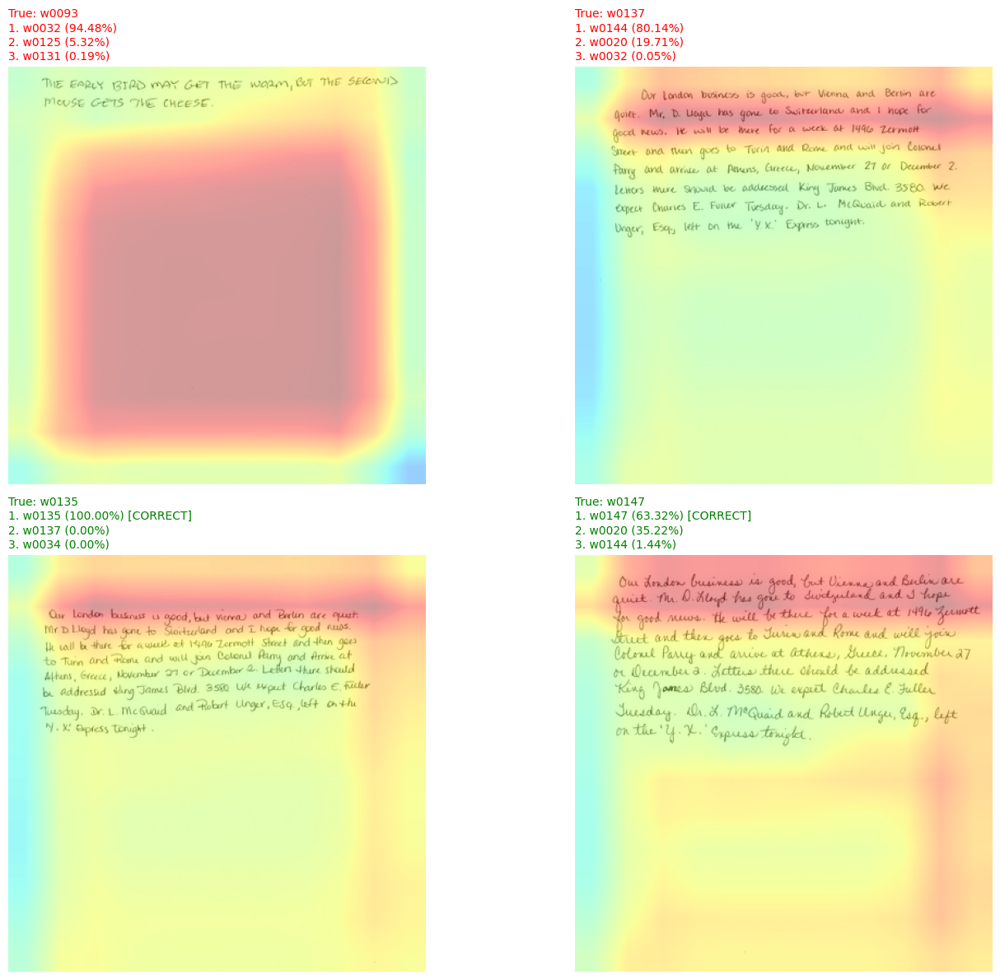

CPU times: user 2.7 s, sys: 84.8 ms, total: 2.79 s
Wall time: 2.58 s


In [23]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model,
                              last_conv_layer_name="post_bn", n=4)

    Labels correct or no?

In [1]:
%%time
xai.plot_ultimate_explanation(test_ds,model,"post_relu")

NameError: name 'xai' is not defined

    ^^runtime crash error

## DenseNet

In [8]:
base_model = DenseNet169(
    include_top = False,
    classifier_activation="softmax",
    weights = "imagenet",
    input_shape=(IMAGE_SIZE + (3,))
    )

def make_transfer_model(base_model, input_shape, num_classes, name):
    backbone = base_model

    backbone.trainable = False

    inputs = layers.Input(input_shape)
    x = keras.applications.densenet.preprocess_input(inputs)
    x = backbone(x)
    x = layers.Dropout(0.3)(x)

    x = layers.GlobalAveragePooling2D()(x)

    x = layers.Dropout(0.25)(x)
    outputs = layers.Dense(num_classes, activation=None)(x)

    return keras.Model(inputs, outputs, name=name)


model = make_transfer_model(base_model,INPUT_SHAPE,NUM_CLASSES,"DenseNet_90")

model.summary()

51877672/51877672 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "DenseNet_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide (TrueDivide)        │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ add (Add)                       │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_1 (TrueDivide)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ densenet169 (Functional)        │ (None, 12, 12, 1664)   │    12,642,880 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 12, 12, 1664)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1664)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 1664)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 90)             │       149,850 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,792,730 (48.80 MB)

 Trainable params: 149,850 (585.35 KB)

 Non-trainable params: 12,642,880 (48.23 MB)

In [9]:
model.get_layer("densenet169").summary()

Model: "densenet169"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d      │ (None, 390, 390,  │          0 │ input_layer[0][0] │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 192, 192,  │      9,408 │ zero_padding2d[0… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 192, 192,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 192, 192,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ zero_padding2d_1    │ (None, 194, 194,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1               │ (None, 96, 96,    │          0 │ zero_padding2d_1… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 96, 96,    │        256 │ pool1[0][0]       │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_relu │ (None, 96, 96,    │          0 │ conv2_block1_0_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 96, 96,    │      8,192 │ conv2_block1_0_r… │
│ (Conv2D)            │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 96, 96,    │        512 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 96, 96,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 128)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 96, 96,    │     36,864 │ conv2_block1_1_r… │
│ (Conv2D)            │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_concat │ (None, 96, 96,    │          0 │ pool1[0][0],      │
│ (Concatenate)       │ 96)               │            │ conv2_block1_2_c… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_bn   │ (None, 96, 96,    │        384 │ conv2_block1_con… │
│ (BatchNormalizatio… │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_0_relu │ (None, 96, 96,    │          0 │ conv2_block2_0_b… │
│ (Activation)        │ 96)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block2_1_conv │ (None, 96, 96,    │     12,288 │ conv2_block2_0_r

 Total params: 12,642,880 (48.23 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 12,642,880 (48.23 MB)

### epochs

In [14]:
%%time

epochs = 100

model.compile(
    optimizer= "adam",
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True), ###make sure is true
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc"),
             keras.metrics.SparseTopKCategoricalAccuracy(k=3, name="top3_acc")],
    )

history = model.fit(
    train_ds,
    epochs= epochs,
    validation_data= val_ds)

model.save("DenseNet_90.keras")

#save metrics
lossacc = pd.DataFrame(history.history)
lossacc.to_csv(f"DenseNet_90_lossacc.csv")

Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 120s 3s/step - acc: 0.0193 - loss: 4.5876 - top3_acc: 0.0474 - val_acc: 0.0796 - val_loss: 4.2921 - val_top3_acc: 0.1722
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step - acc: 0.0548 - loss: 4.2414 - top3_acc: 0.1296 - val_acc: 0.1333 - val_loss: 4.0572 - val_top3_acc: 0.3352
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - acc: 0.1341 - loss: 3.9707 - top3_acc: 0.2622 - val_acc: 0.2389 - val_loss: 3.8732 - val_top3_acc: 0.4185
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 106ms/step - acc: 0.1822 - loss: 3.7884 - top3_acc: 0.3400 - val_acc: 0.3204 - val_loss: 3.7069 - val_top3_acc: 0.5167
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - acc: 0.2363 - loss: 3.6093 - top3_acc: 0.4281 - val_acc: 0.3611 - val_loss: 3.5651 - val_top3_acc: 0.5667
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 2s 107ms/step - acc: 0.2859 - loss: 3.4569 - top3_acc: 0.4770 - val_acc: 0.4000 - val_loss: 3.4333 - val_top3_acc: 0.6130
Epoch 7/100
22/22 ━━━━━━━━━━━━━━━━━

### Visualization

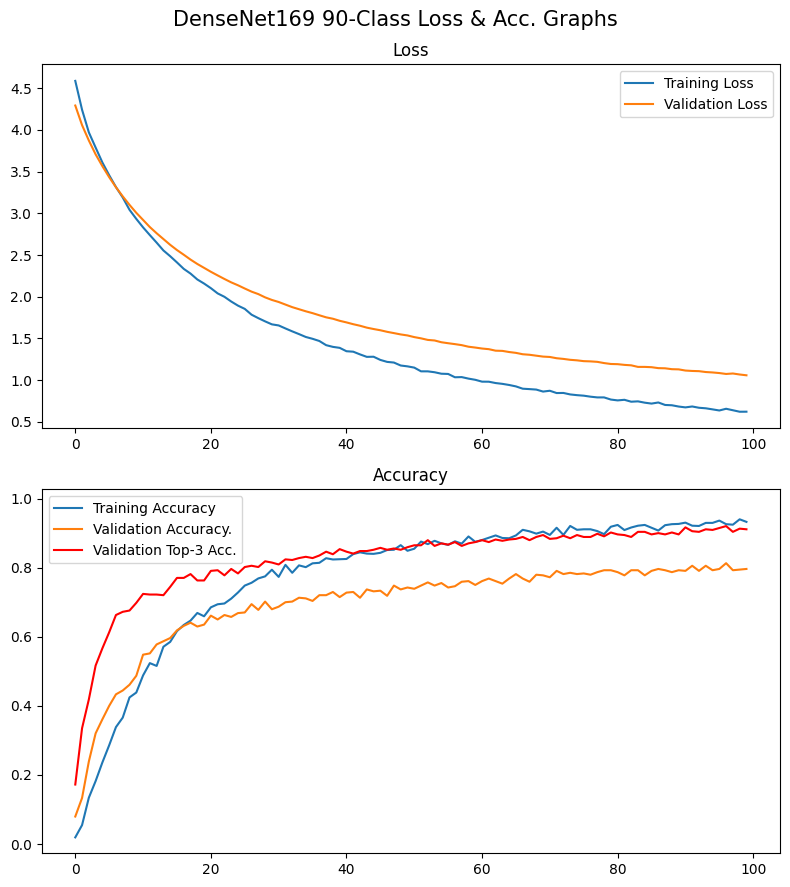

In [15]:
plt.figure(figsize=(8,9))
plt.suptitle("DenseNet169 90-Class Loss & Acc. Graphs",size=15)

plt.subplot(2,1,1)
plt.plot(range(len(history.history["loss"])),history.history["loss"],label="Training Loss")
plt.plot(range(len(history.history["val_loss"])),history.history["val_loss"],label="Validation Loss")
plt.title("Loss")
plt.legend()

plt.subplot(2,1,2)
plt.plot(range(len(history.history["acc"])),history.history["acc"],label="Training Accuracy")
plt.plot(range(len(history.history["val_acc"])),history.history["val_acc"],label="Validation Accuracy.")
plt.plot(range(len(history.history["val_top3_acc"])),history.history["val_top3_acc"],label="Validation Top-3 Acc.",color="red")
plt.title("Accuracy")
bottom,top=plt.ylim()
plt.ylim(bottom,1-bottom)
plt.legend()

plt.tight_layout()
plt.show()

    fast convergence

### Test Set

9/9 ━━━━━━━━━━━━━━━━━━━━ 1s 72ms/step - acc: 0.8111 - loss: 1.0671 - top3_acc: 0.9093
{'acc': 0.8111110925674438, 'loss': 1.0671441555023193, 'top3_acc': 0.9092592597007751}

2/2 ━━━━━━━━━━━━━━━━━━━━ 29s 76ms/step


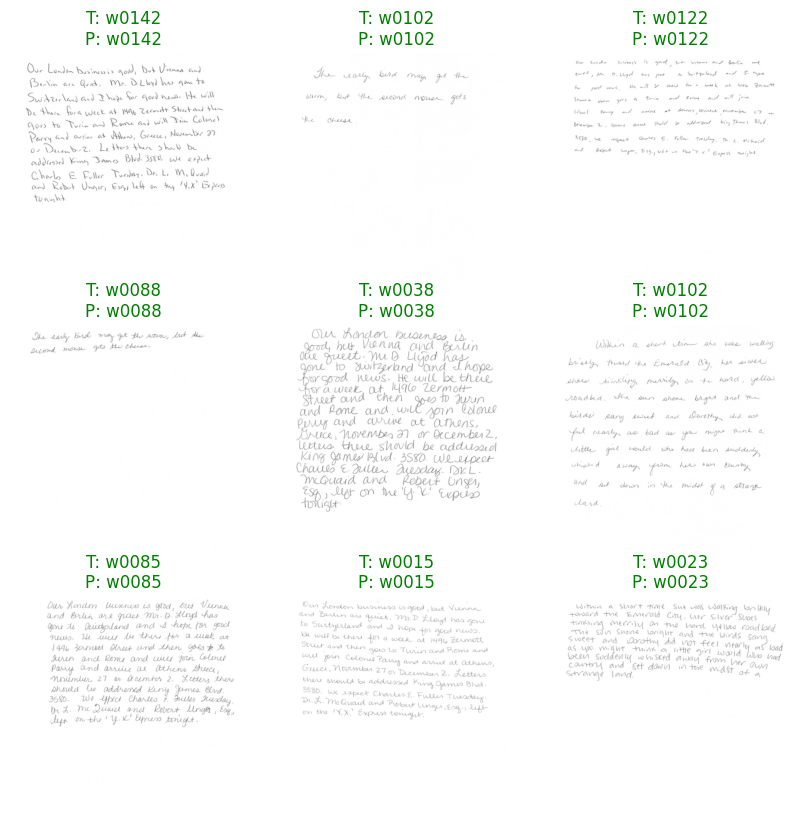

In [16]:
results = model.evaluate(test_ds, return_dict=True)

print(results)
print()

reload_data2.show_testpreds(test_ds,model)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step


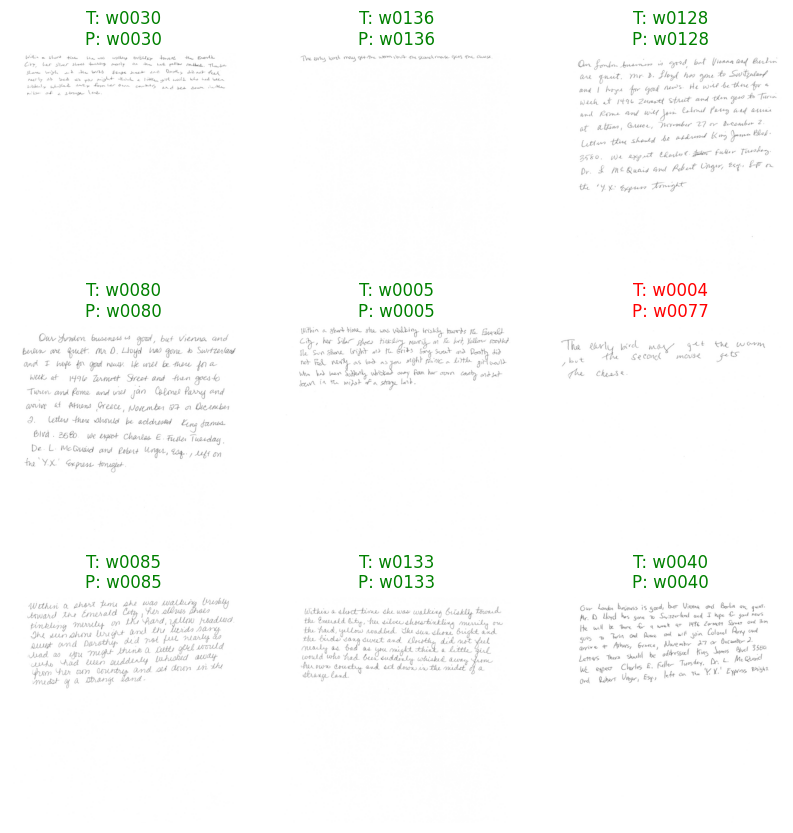

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step


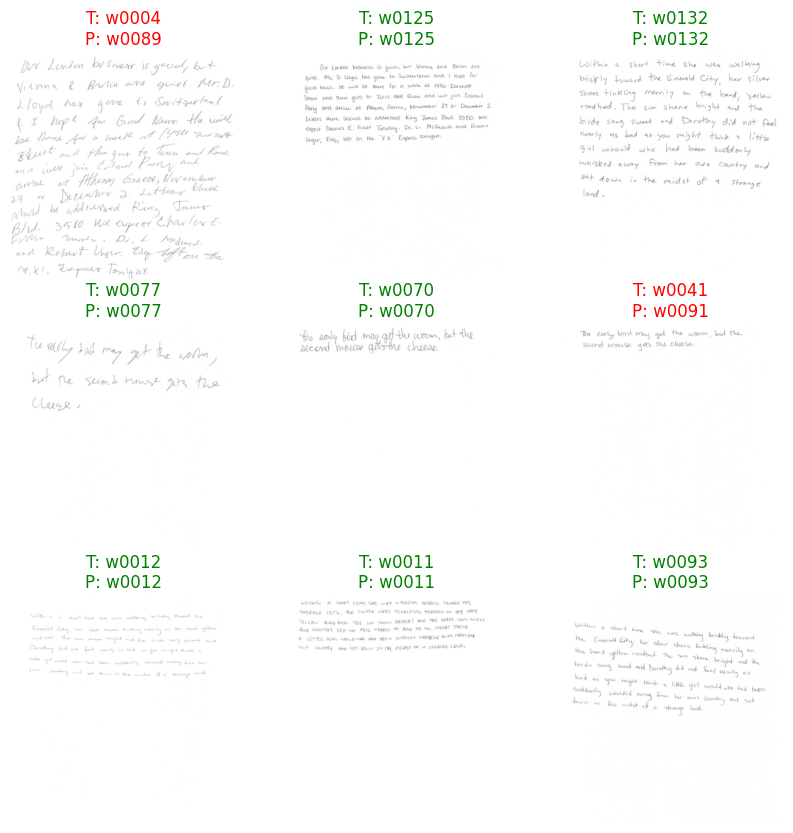

In [17]:
reload_data2.show_testpreds(test_ds,model)
reload_data2.show_testpreds(test_ds,model)

### XAI

In [21]:
model.get_layer("densenet169").layers

[<InputLayer name=input_layer, built=True>,
 <ZeroPadding2D name=zero_padding2d, built=True>,
 <Conv2D name=conv1_conv, built=True>,
 <BatchNormalization name=conv1_bn, built=True>,
 <Activation name=conv1_relu, built=True>,
 <ZeroPadding2D name=zero_padding2d_1, built=True>,
 <MaxPooling2D name=pool1, built=True>,
 <BatchNormalization name=conv2_block1_0_bn, built=True>,
 <Activation name=conv2_block1_0_relu, built=True>,
 <Conv2D name=conv2_block1_1_conv, built=True>,
 <BatchNormalization name=conv2_block1_1_bn, built=True>,
 <Activation name=conv2_block1_1_relu, built=True>,
 <Conv2D name=conv2_block1_2_conv, built=True>,
 <Concatenate name=conv2_block1_concat, built=True>,
 <BatchNormalization name=conv2_block2_0_bn, built=True>,
 <Activation name=conv2_block2_0_relu, built=True>,
 <Conv2D name=conv2_block2_1_conv, built=True>,
 <BatchNormalization name=conv2_block2_1_bn, built=True>,
 <Activation name=conv2_block2_1_relu, built=True>,
 <Conv2D name=conv2_block2_2_conv, built=True>

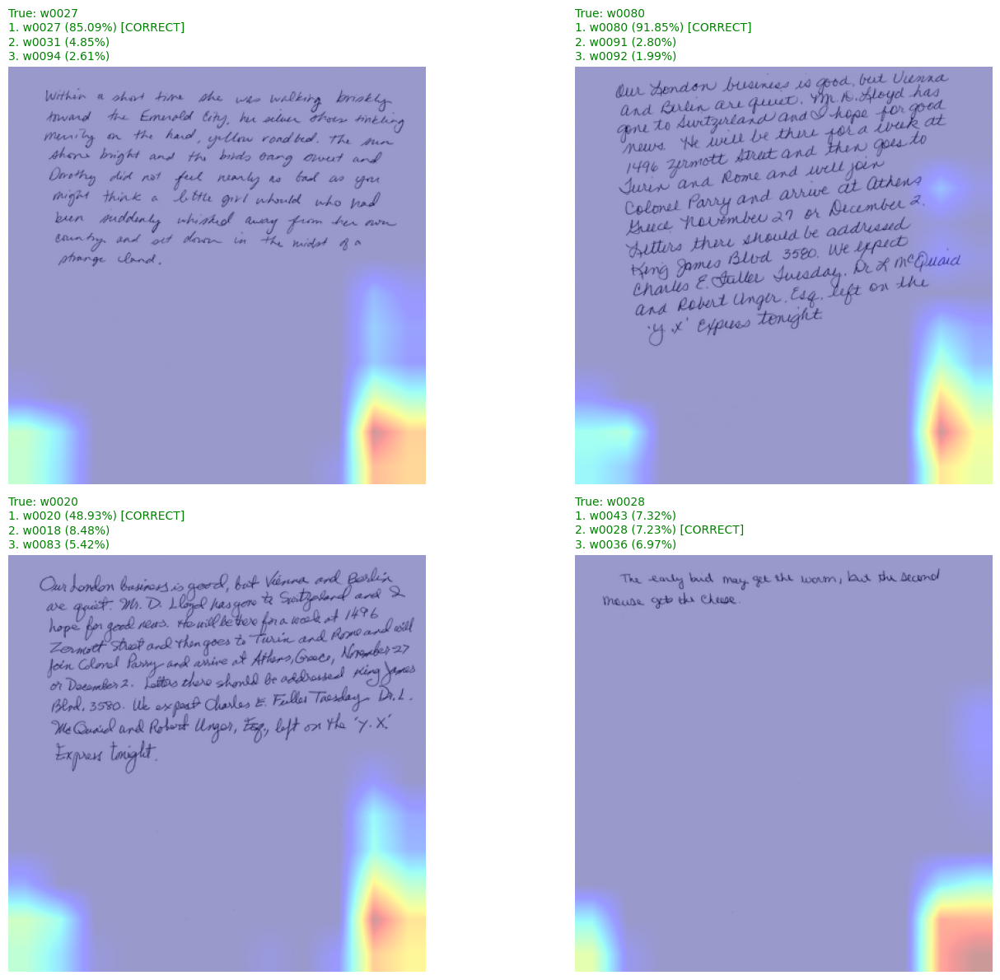

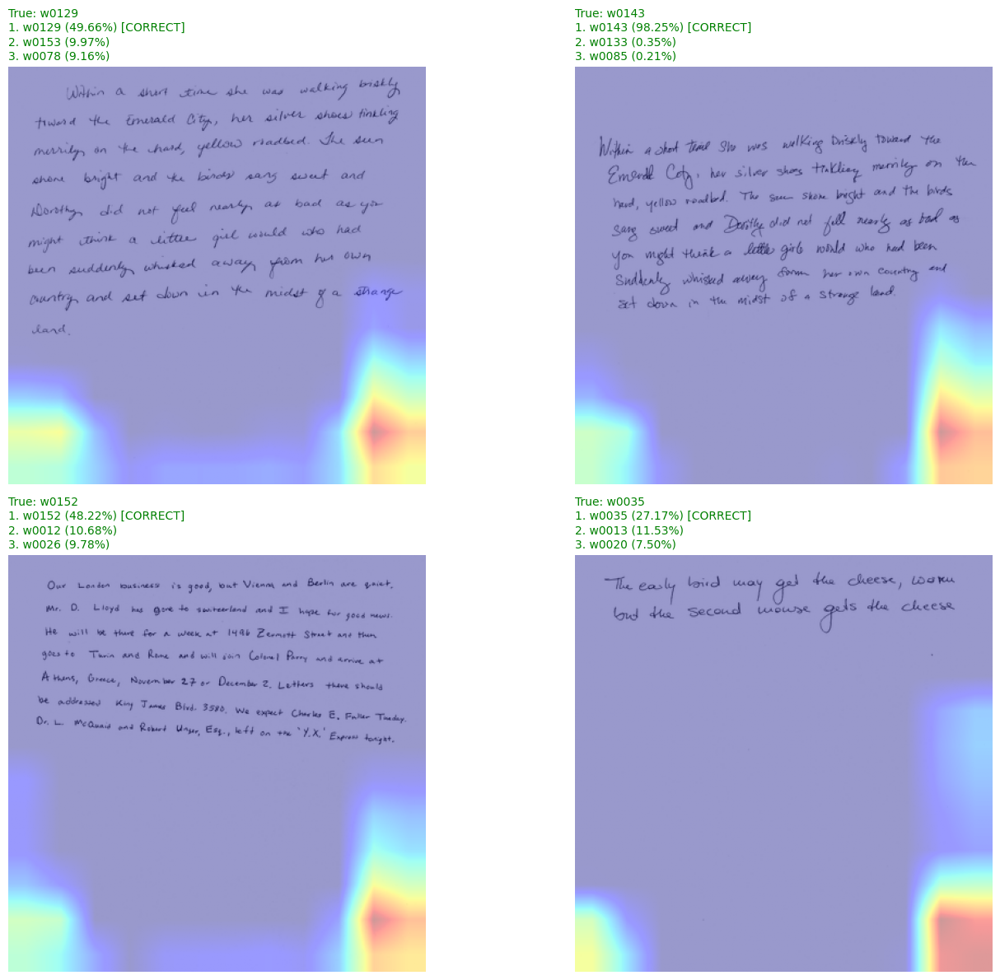

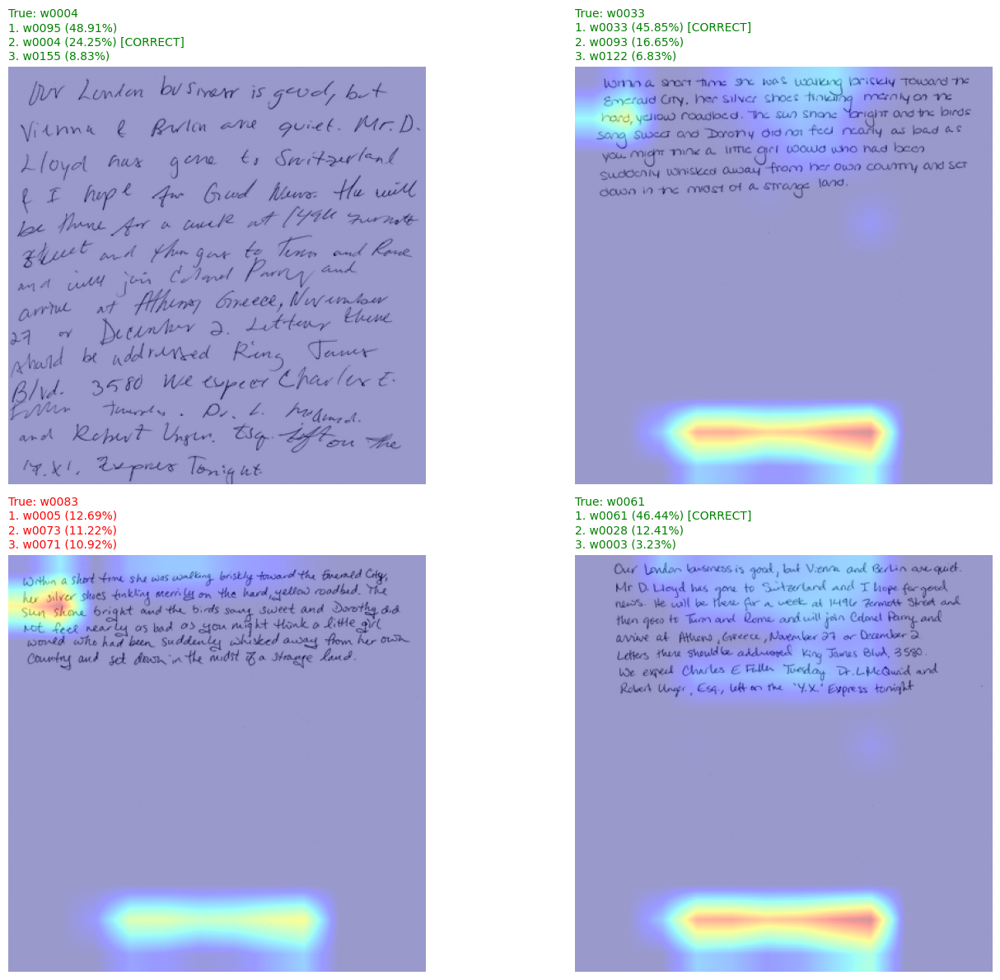

CPU times: user 18.7 s, sys: 254 ms, total: 18.9 s
Wall time: 18.1 s


In [24]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="conv5_block32_concat", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="bn", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="conv5_block32_2_conv", n=4)

  0%|          | 0/500 [00:00<?, ?it/s]

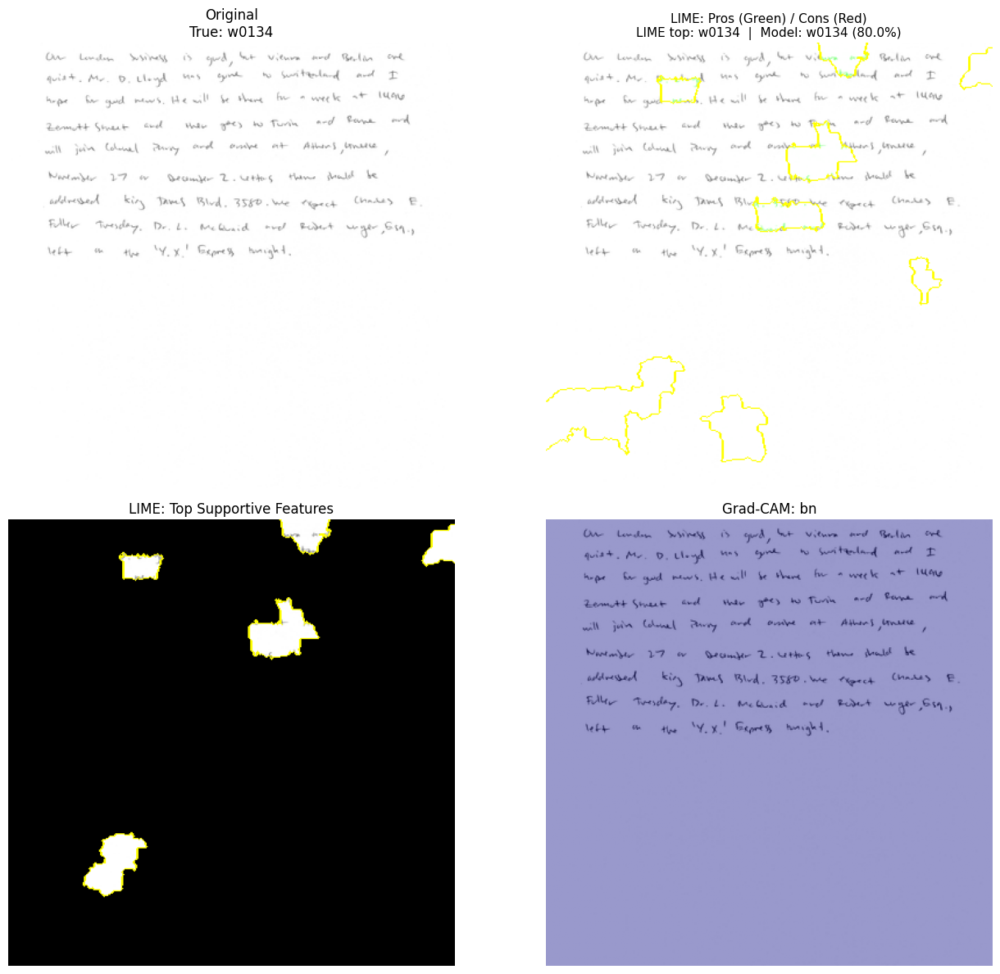

CPU times: user 16.4 s, sys: 1.32 s, total: 17.7 s
Wall time: 17.2 s


In [25]:
%%time
xai.plot_ultimate_explanation(test_ds,model,"bn")

  0%|          | 0/500 [00:00<?, ?it/s]

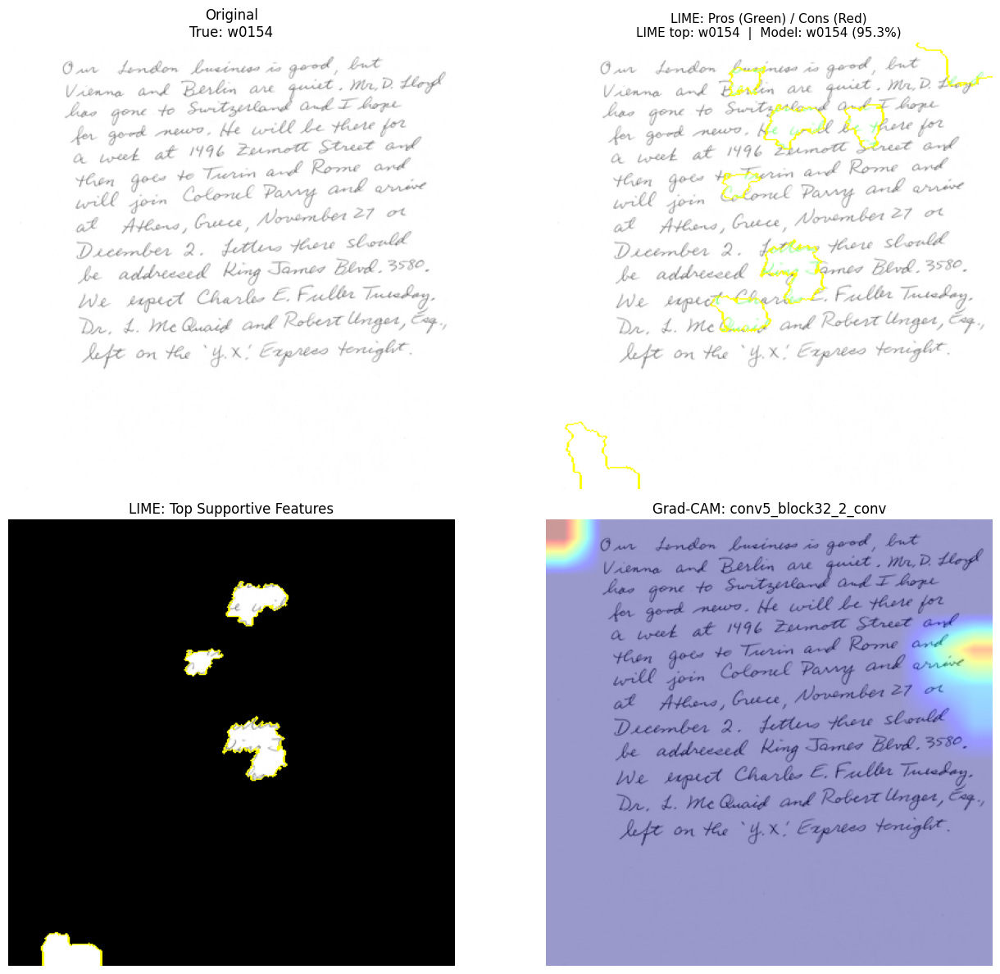

  0%|          | 0/500 [00:00<?, ?it/s]

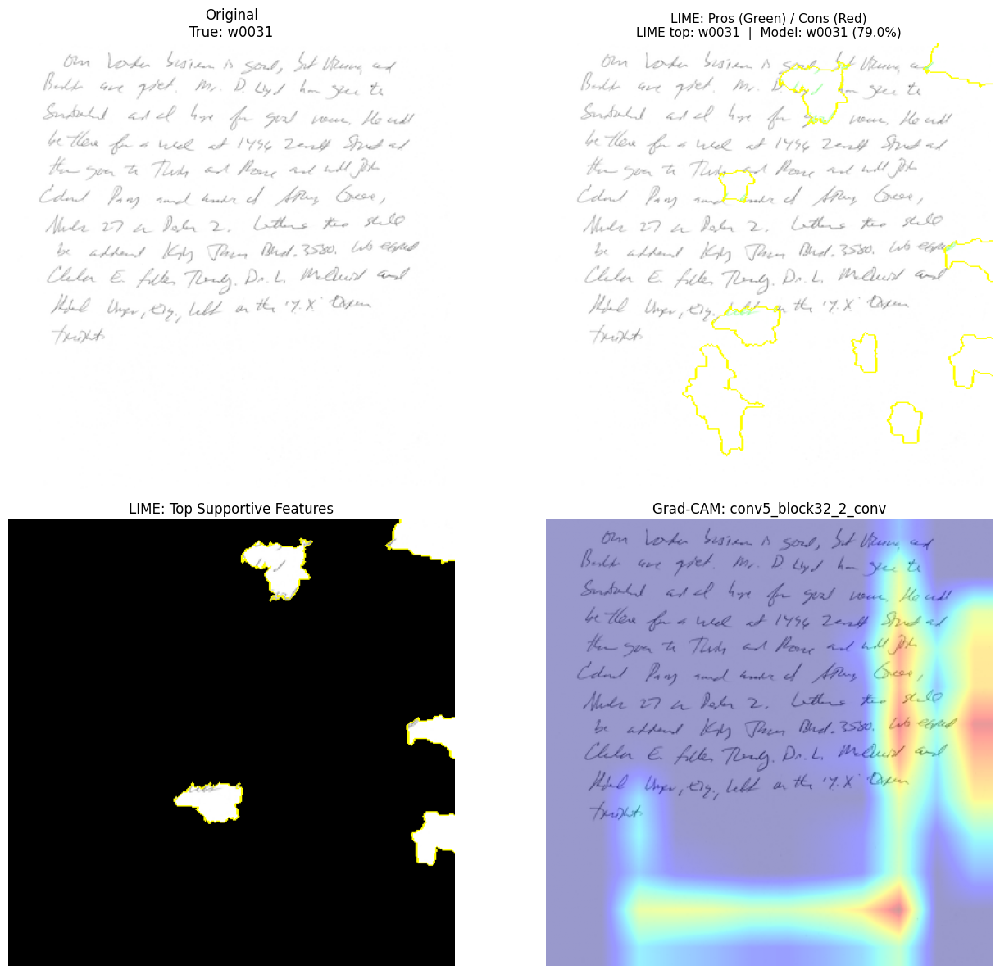

  0%|          | 0/500 [00:00<?, ?it/s]

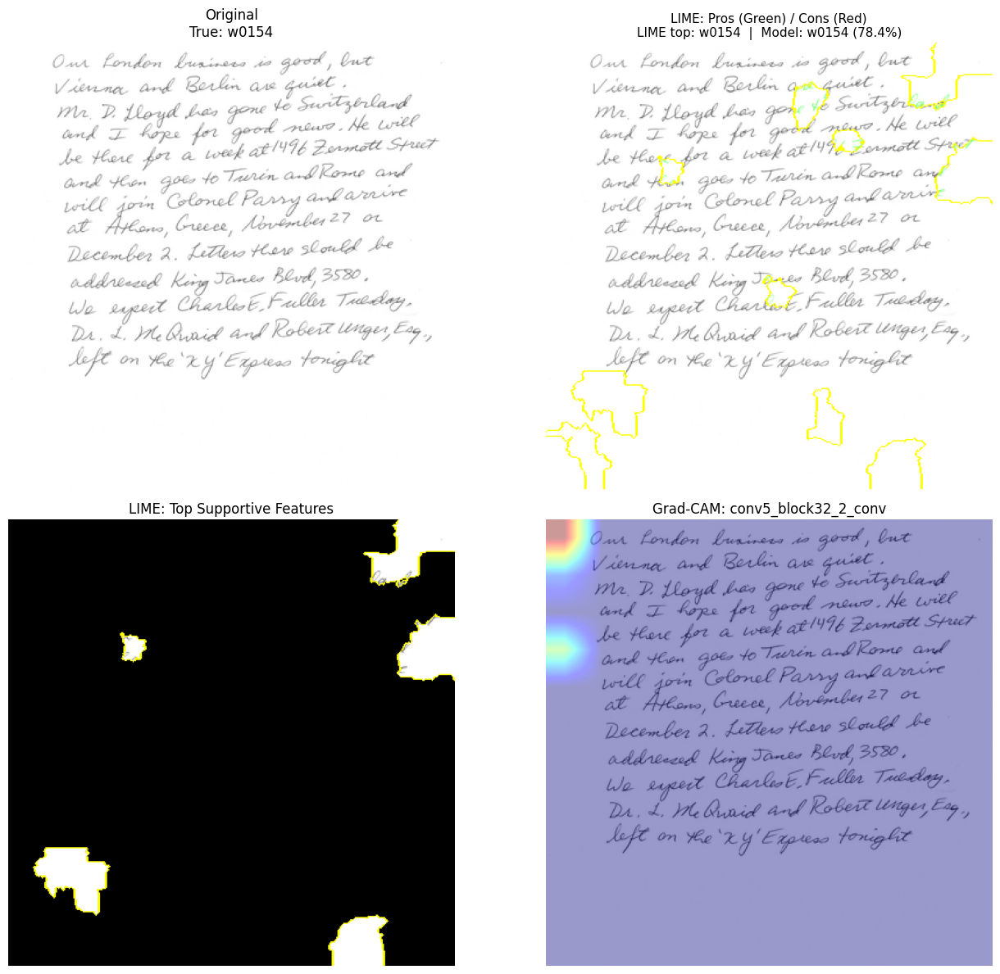

CPU times: user 50 s, sys: 5.09 s, total: 55.1 s
Wall time: 53.5 s


In [27]:
%%time
xai.plot_ultimate_explanation(test_ds,model,"conv5_block32_2_conv")
xai.plot_ultimate_explanation(test_ds,model,"conv5_block32_2_conv")
xai.plot_ultimate_explanation(test_ds,model,"conv5_block32_2_conv")

  0%|          | 0/500 [00:00<?, ?it/s]

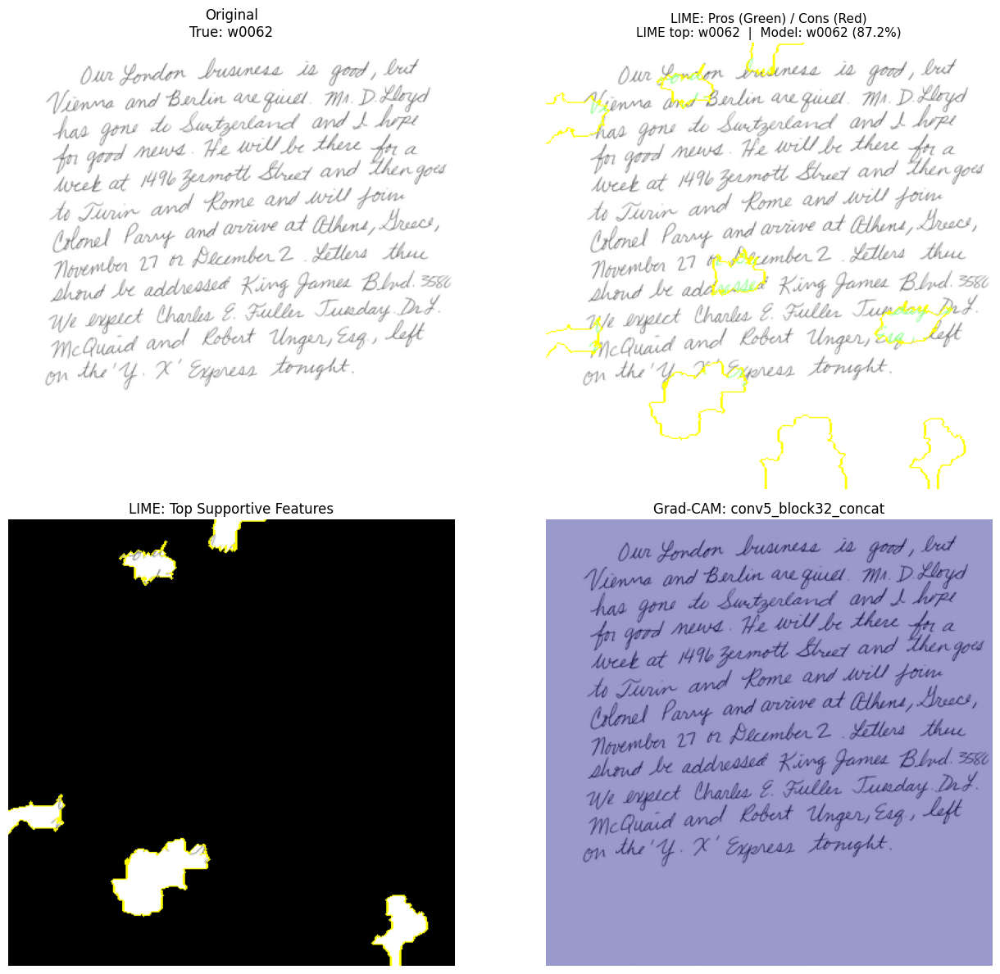

  0%|          | 0/500 [00:00<?, ?it/s]

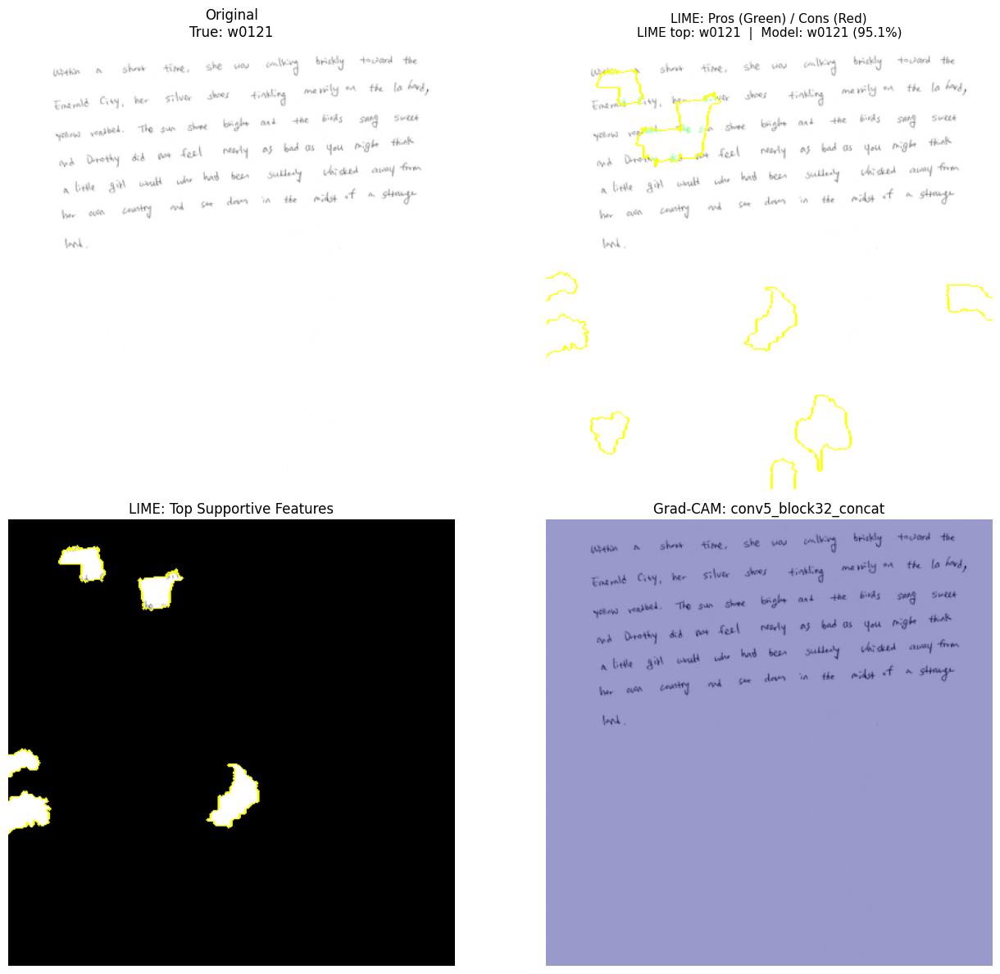

  0%|          | 0/500 [00:00<?, ?it/s]

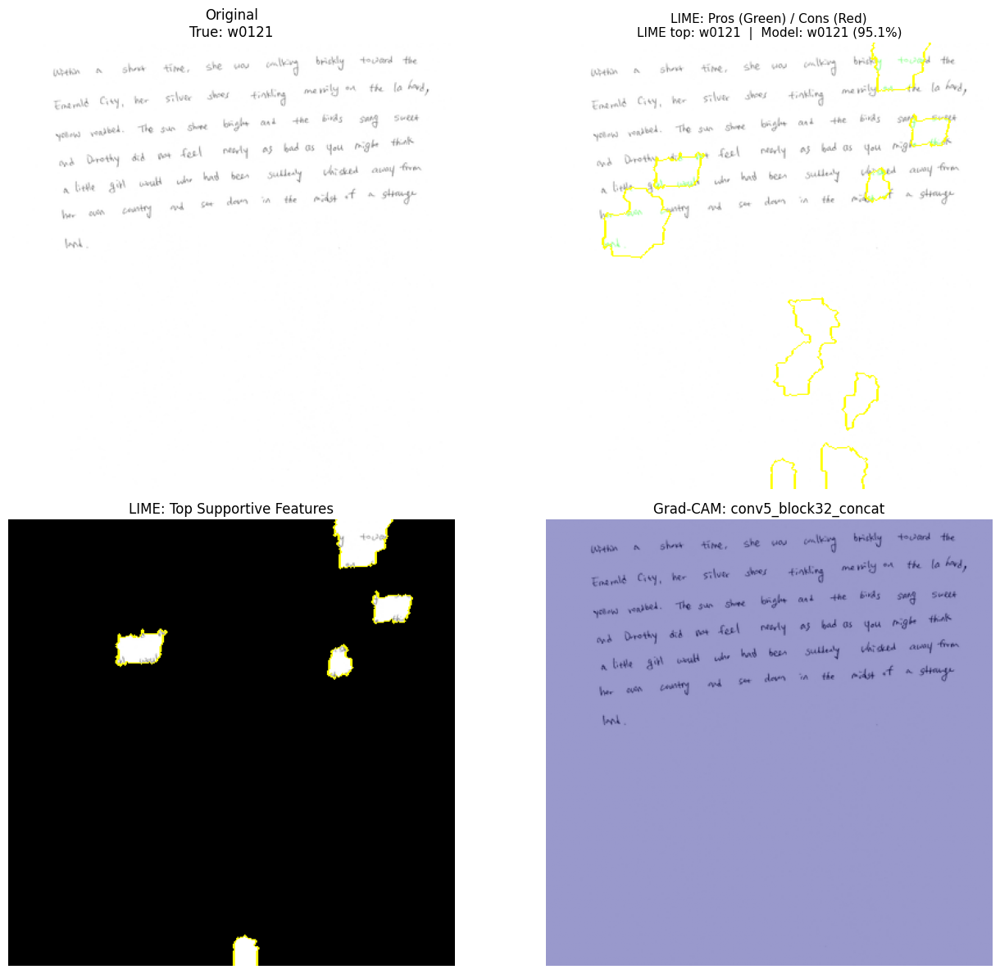

CPU times: user 49.4 s, sys: 5.14 s, total: 54.5 s
Wall time: 52.9 s


In [29]:
%%time
xai.plot_ultimate_explanation(test_ds,model,"conv5_block32_concat")
xai.plot_ultimate_explanation(test_ds,model,"conv5_block32_concat")
xai.plot_ultimate_explanation(test_ds,model,"conv5_block32_concat")

# EfficientNetV2B1

In [30]:
base_model = EfficientNetV2B1(
    include_top = False,
    classifier_activation="softmax",
    weights = "imagenet",
    input_shape=(IMAGE_SIZE + (3,))
    )

def make_transfer_model(base_model, input_shape, num_classes, name):
    backbone = base_model

    backbone.trainable = False

    inputs = layers.Input(input_shape)
    x = keras.applications.efficientnet_v2.preprocess_input(inputs)
    x = backbone(x)
    x = layers.Dropout(0.3)(x)

    x = layers.GlobalAveragePooling2D()(x)

    x = layers.Dropout(0.25)(x)
    outputs = layers.Dense(num_classes, activation=None)(x)

    return keras.Model(inputs, outputs, name=name)


model = make_transfer_model(base_model,INPUT_SHAPE,NUM_CLASSES,"EffNet_90")

model.summary()

28456008/28456008 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Model: "EffNet_90"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 384, 384, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetv2-b1 (Functional)  │ (None, 12, 12, 1280)   │     6,931,124 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 12, 12, 1280)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 90)             │       115,290 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,046,414 (26.88 MB)

 Trainable params: 115,290 (450.35 KB)

 Non-trainable params: 6,931,124 (26.44 MB)

In [31]:
model.get_layer("efficientnetv2-b1").summary()

Model: "efficientnetv2-b1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 384, 384,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ rescaling           │ (None, 384, 384,  │          0 │ input_layer_2[0]… │
│ (Rescaling)         │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ normalization       │ (None, 384, 384,  │          0 │ rescaling[0][0]   │
│ (Normalization)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_conv (Conv2D)  │ (None, 192, 192,  │        864 │ normalization[0]… │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_bn             │ (None, 192, 192,  │        128 │ stem_conv[0][0]   │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stem_activation     │ (None, 192, 192,  │          0 │ stem_bn[0][0]     │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_co… │ (None, 192, 192,  │      4,608 │ stem_activation[… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_bn  │ (None, 192, 192,  │         64 │ block1a_project_… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1a_project_ac… │ (None, 192, 192,  │          0 │ block1a_project_… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_co… │ (None, 192, 192,  │      2,304 │ block1a_project_… │
│ (Conv2D)            │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_bn  │ (None, 192, 192,  │         64 │ block1b_project_… │
│ (BatchNormalizatio… │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_project_ac… │ (None, 192, 192,  │          0 │ block1b_project_… │
│ (Activation)        │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_drop        │ (None, 192, 192,  │          0 │ block1b_project_… │
│ (Dropout)           │ 16)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block1b_add (Add)   │ (None, 192, 192,  │          0 │ block1b_drop[0][… │
│                     │ 16)               │            │ block1a_project_… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_conv │ (None, 96, 96,    │      9,216 │ block1b_add[0][0] │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_bn   │ (None, 96, 96,    │        256 │ block2a_expand_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ block2a_expand_act… │ (None, 96, 96,    │          0 │ block2a_expand_b

 Total params: 6,931,124 (26.44 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 6,931,124 (26.44 MB)

### epochs

In [32]:
%%time

epochs = 100

model.compile(
    optimizer= "adam",
    loss=keras.losses.SparseCategoricalCrossentropy(from_logits=True), ###make sure is true
    metrics=[keras.metrics.SparseCategoricalAccuracy(name="acc"),
             keras.metrics.SparseTopKCategoricalAccuracy(k=3, name="top3_acc")],
    )

history = model.fit(
    train_ds,
    epochs= epochs,
    validation_data= val_ds)

model.save("EffNet_90.keras")

#save metrics
lossacc = pd.DataFrame(history.history)
lossacc.to_csv(f"EffNet_90_lossacc.csv")

Epoch 1/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 110s 3s/step - acc: 0.0089 - loss: 4.5821 - top3_acc: 0.0385 - val_acc: 0.0352 - val_loss: 4.3590 - val_top3_acc: 0.1222
Epoch 2/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - acc: 0.0319 - loss: 4.3229 - top3_acc: 0.0904 - val_acc: 0.1019 - val_loss: 4.2178 - val_top3_acc: 0.1944
Epoch 3/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - acc: 0.0607 - loss: 4.1901 - top3_acc: 0.1570 - val_acc: 0.1037 - val_loss: 4.1022 - val_top3_acc: 0.2481
Epoch 4/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - acc: 0.0815 - loss: 4.0739 - top3_acc: 0.1993 - val_acc: 0.1315 - val_loss: 4.0027 - val_top3_acc: 0.3074
Epoch 5/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 58ms/step - acc: 0.1178 - loss: 3.9685 - top3_acc: 0.2444 - val_acc: 0.1981 - val_loss: 3.9099 - val_top3_acc: 0.3704
Epoch 6/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 1s 59ms/step - acc: 0.1356 - loss: 3.8676 - top3_acc: 0.2844 - val_acc: 0.2167 - val_loss: 3.8290 - val_top3_acc: 0.4111
Epoch 7/100
22/22 ━━━━━━━━━━━━━━━━━━━━ 1

### Visualization

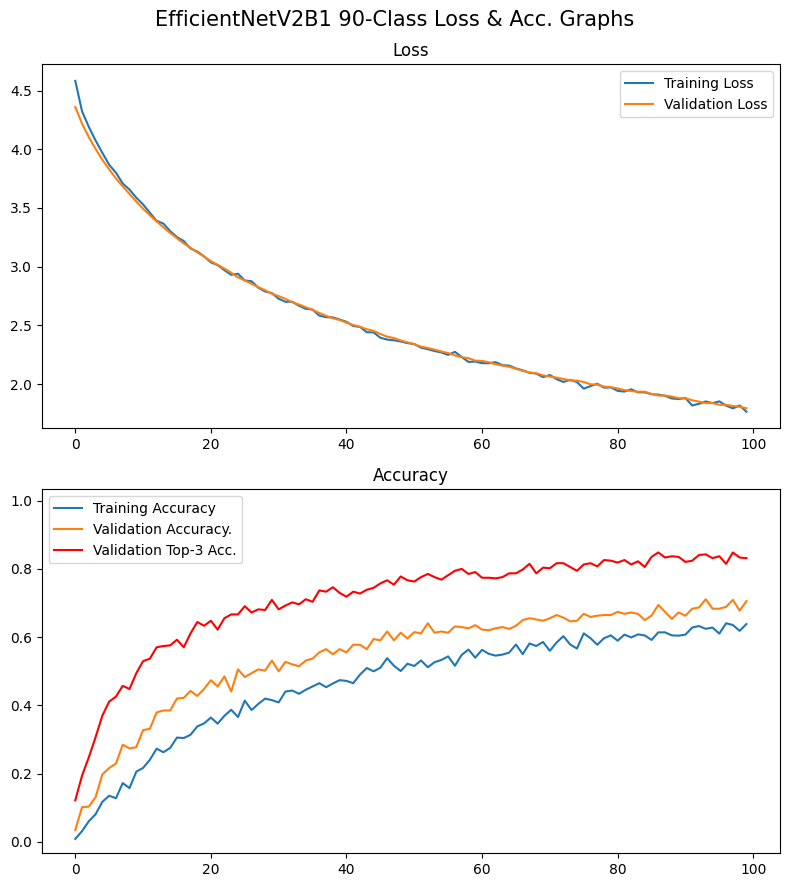

In [33]:
plt.figure(figsize=(8,9))
plt.suptitle("EfficientNetV2B1 90-Class Loss & Acc. Graphs",size=15)

plt.subplot(2,1,1)
plt.plot(range(len(history.history["loss"])),history.history["loss"],label="Training Loss")
plt.plot(range(len(history.history["val_loss"])),history.history["val_loss"],label="Validation Loss")
plt.title("Loss")
plt.legend()

plt.subplot(2,1,2)
plt.plot(range(len(history.history["acc"])),history.history["acc"],label="Training Accuracy")
plt.plot(range(len(history.history["val_acc"])),history.history["val_acc"],label="Validation Accuracy.")
plt.plot(range(len(history.history["val_top3_acc"])),history.history["val_top3_acc"],label="Validation Top-3 Acc.",color="red")
plt.title("Accuracy")
bottom,top=plt.ylim()
plt.ylim(bottom,1-bottom)
plt.legend()

plt.tight_layout()
plt.show()

### Test Set

9/9 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - acc: 0.7148 - loss: 1.7855 - top3_acc: 0.8426
{'acc': 0.7148148417472839, 'loss': 1.7855027914047241, 'top3_acc': 0.8425925970077515}

2/2 ━━━━━━━━━━━━━━━━━━━━ 23s 52ms/step


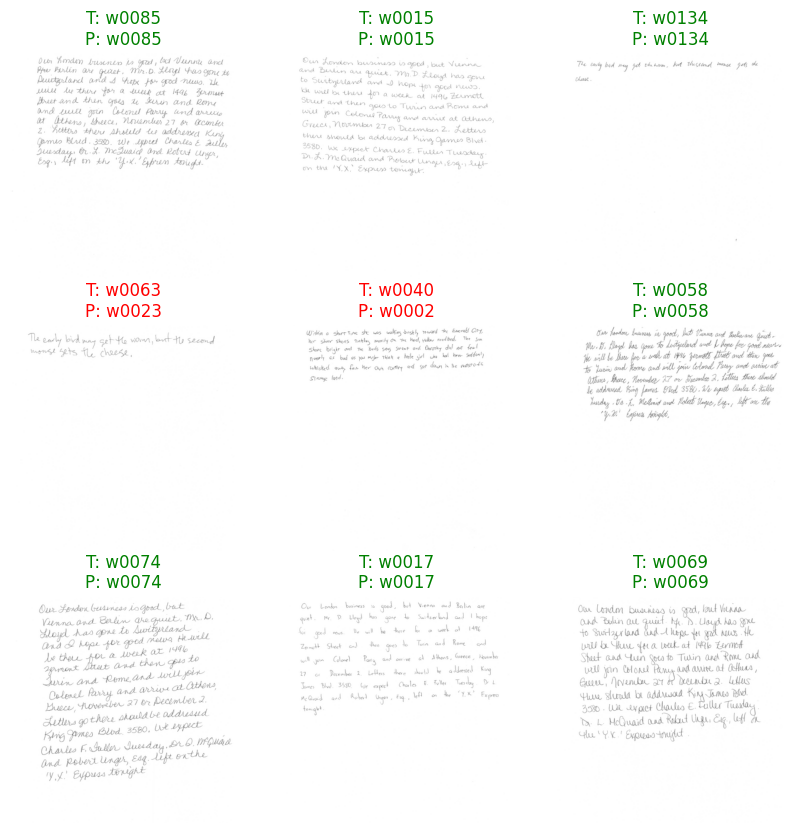

In [34]:
results = model.evaluate(test_ds, return_dict=True)

print(results)
print()

reload_data2.show_testpreds(test_ds,model)

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step


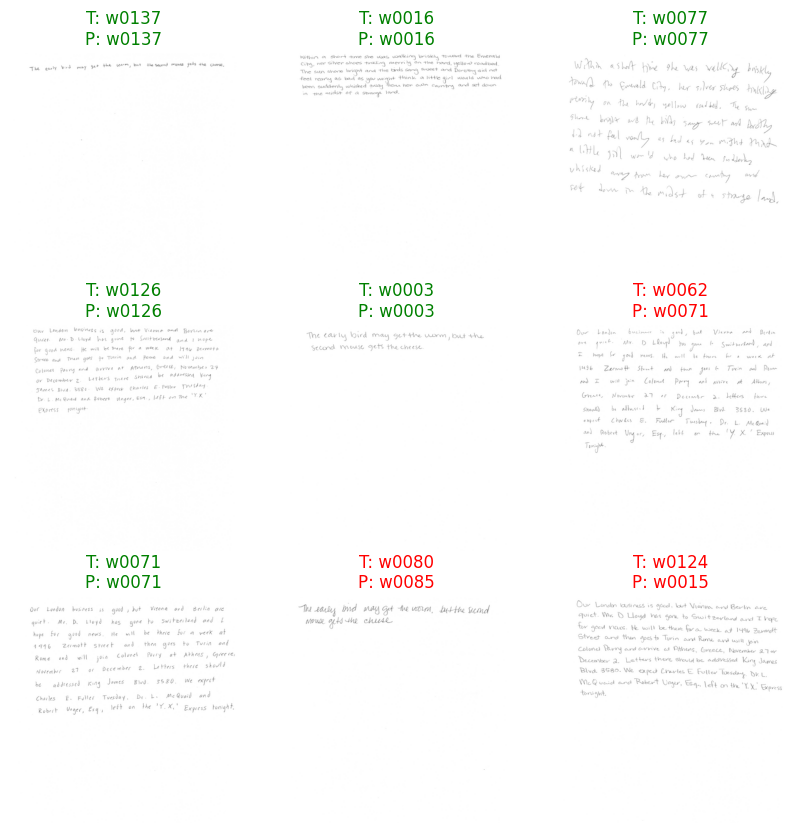

2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step


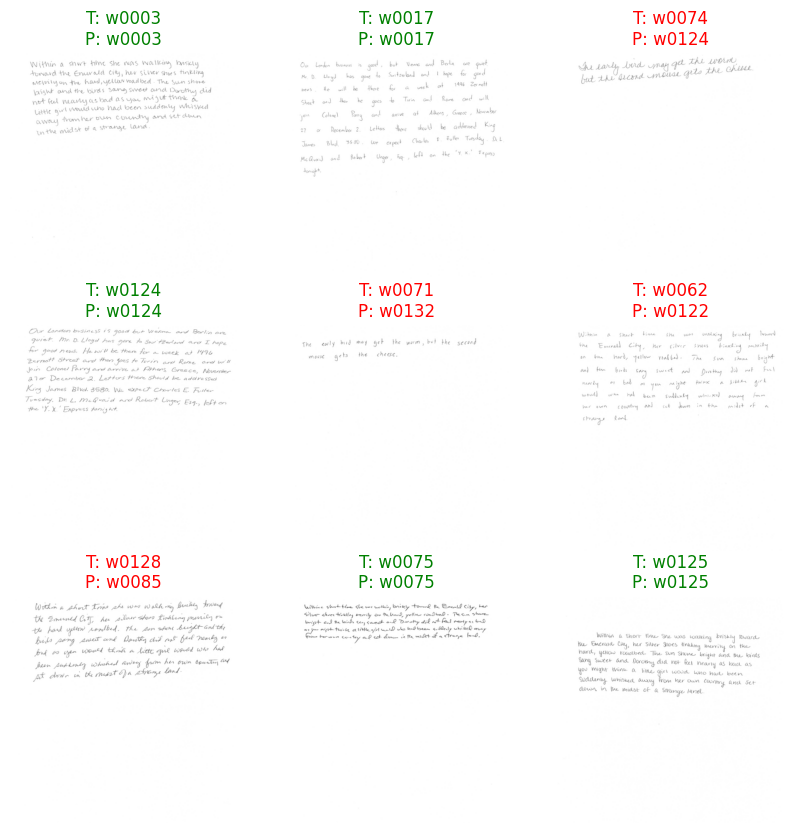

In [35]:
reload_data2.show_testpreds(test_ds,model)
reload_data2.show_testpreds(test_ds,model)

### XAI

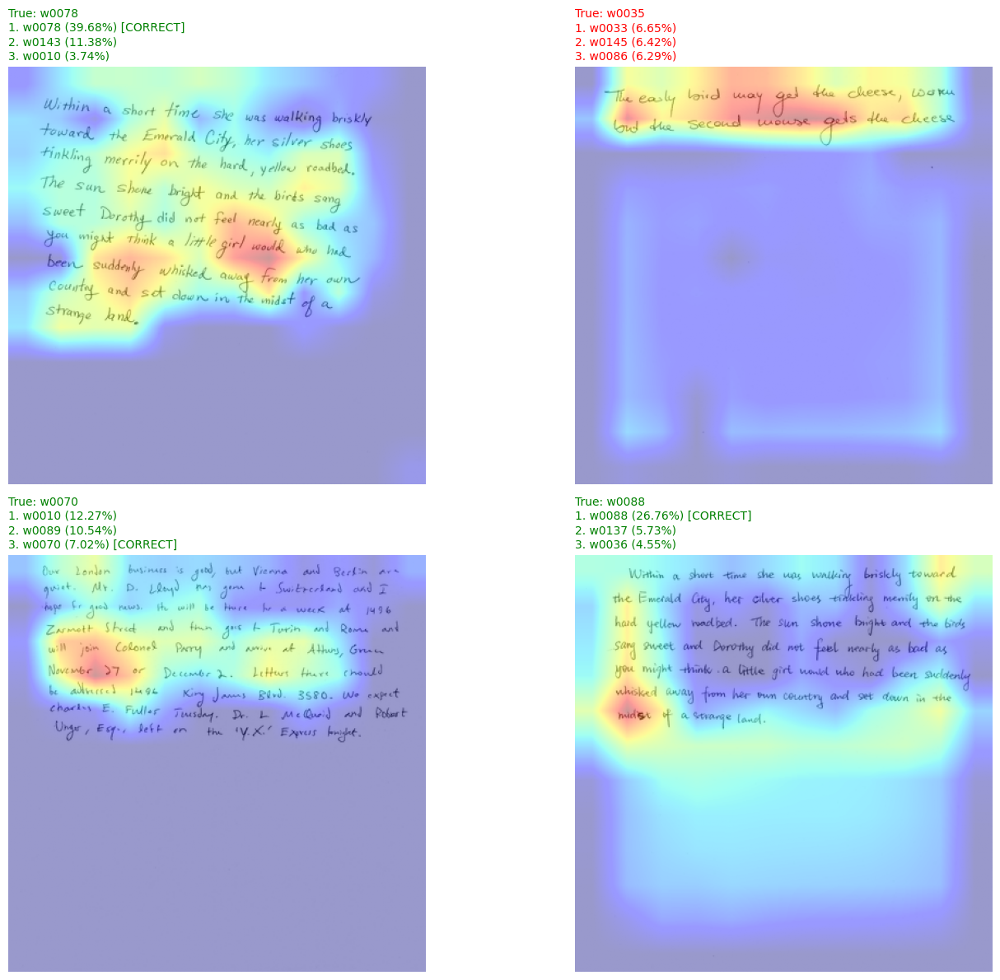

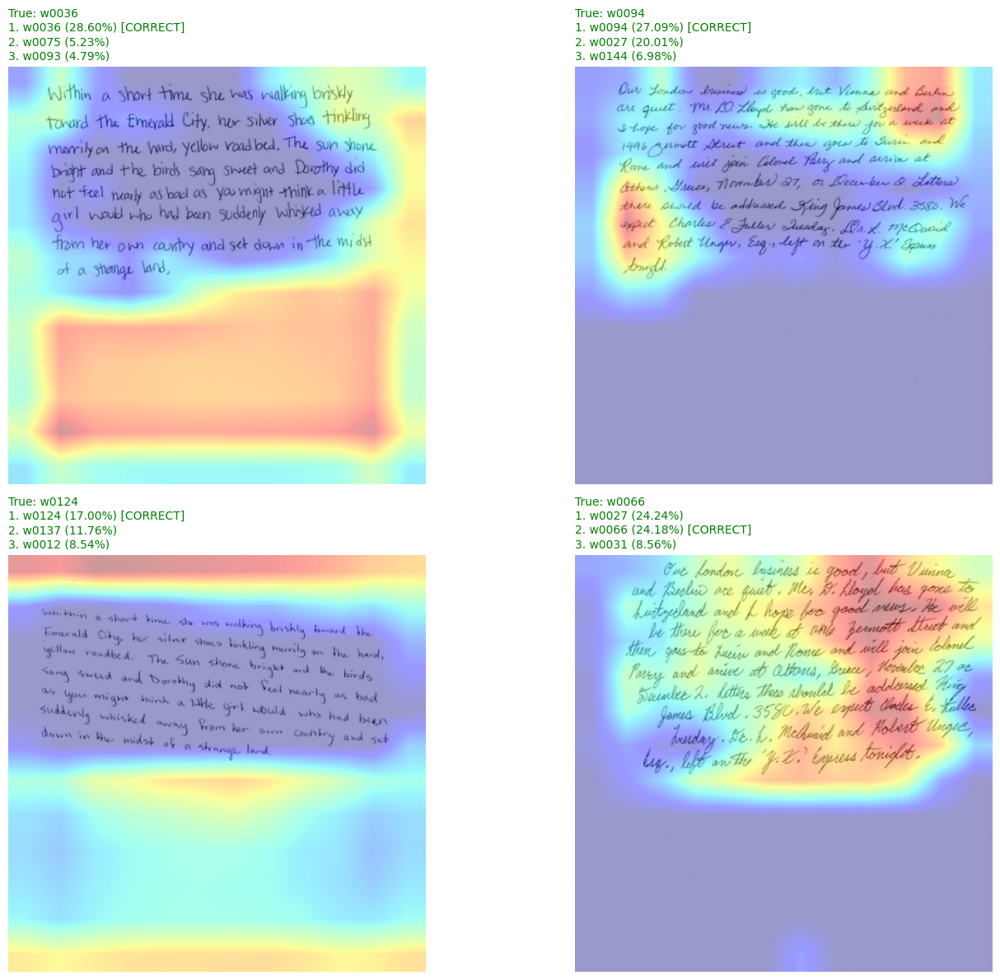

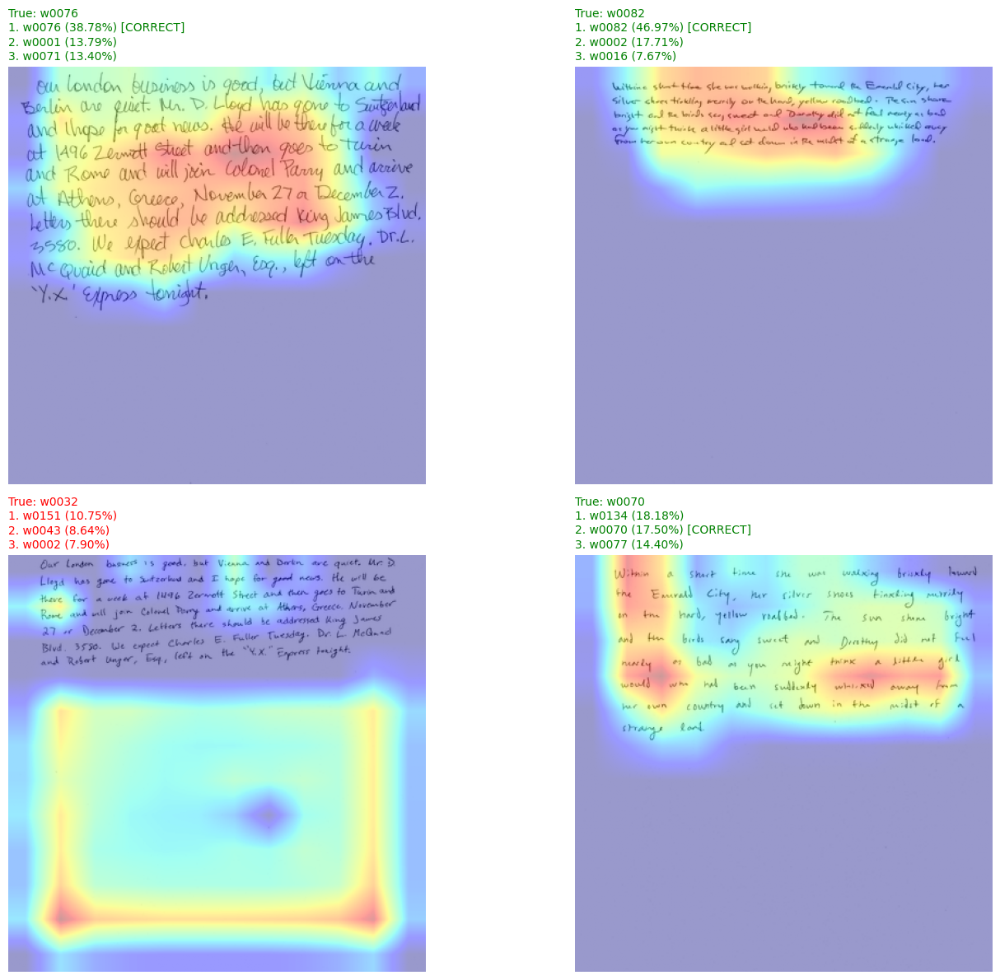

CPU times: user 28.4 s, sys: 828 ms, total: 29.2 s
Wall time: 28.8 s


In [36]:
%%time
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="top_conv", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="top_conv", n=4)
xai.plot_gradcam_from_dataset(test_ds, model, last_conv_layer_name="top_conv", n=4)

    Seems to be focusing on the correct areas

  0%|          | 0/500 [00:00<?, ?it/s]

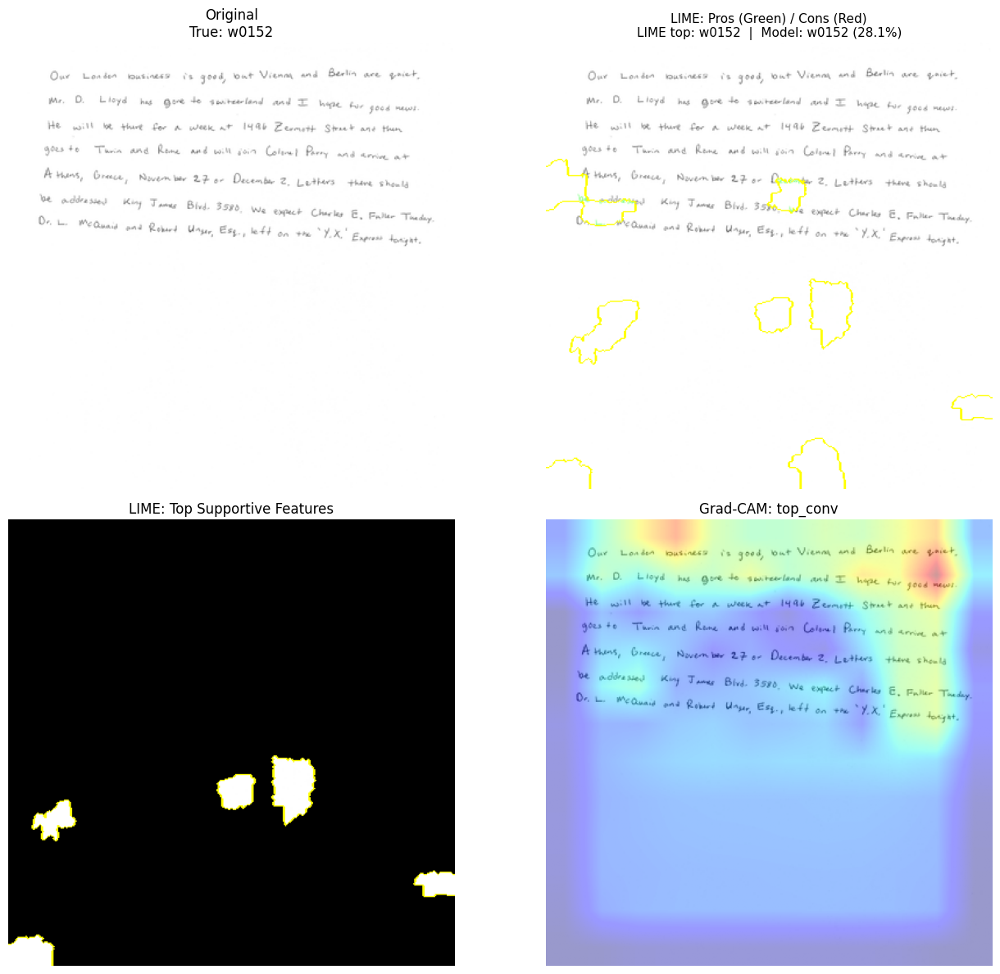

CPU times: user 39.2 s, sys: 1.84 s, total: 41 s
Wall time: 34.6 s


In [37]:
%%time
xai.plot_ultimate_explanation(test_ds,model,"top_conv")

  0%|          | 0/500 [00:00<?, ?it/s]

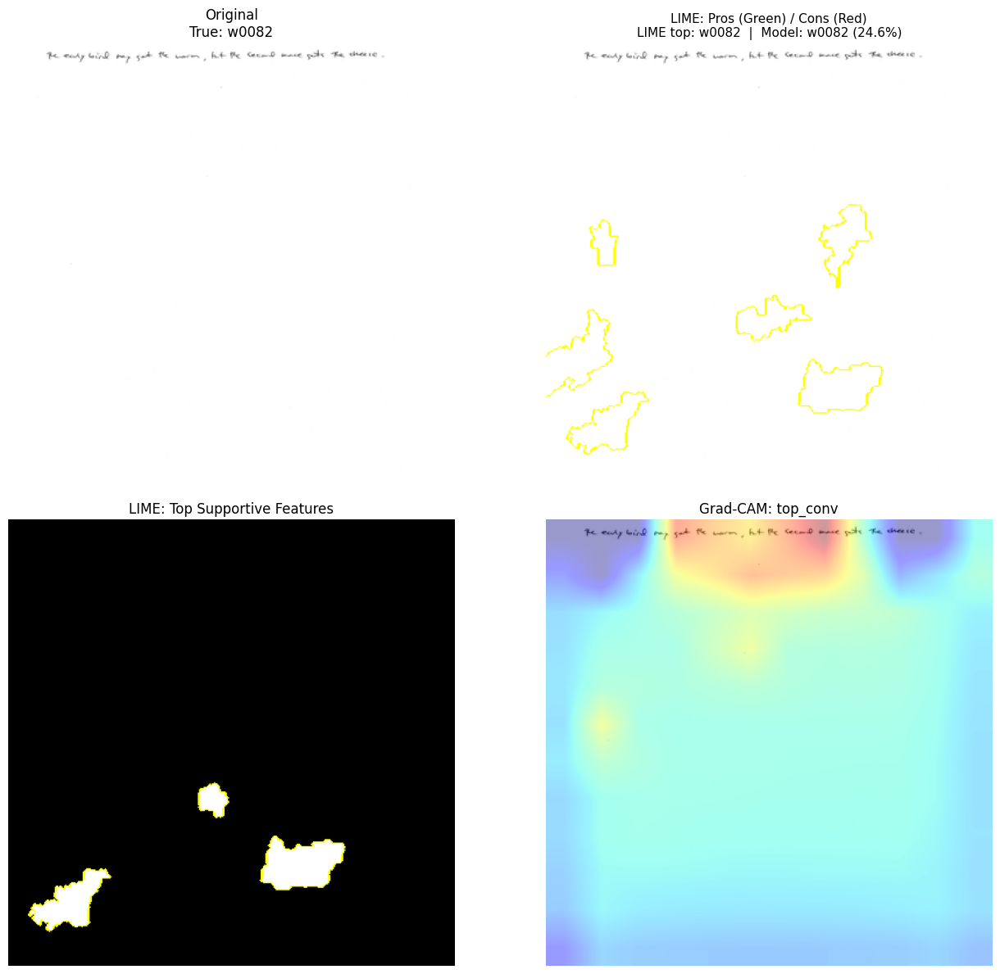

  0%|          | 0/500 [00:00<?, ?it/s]

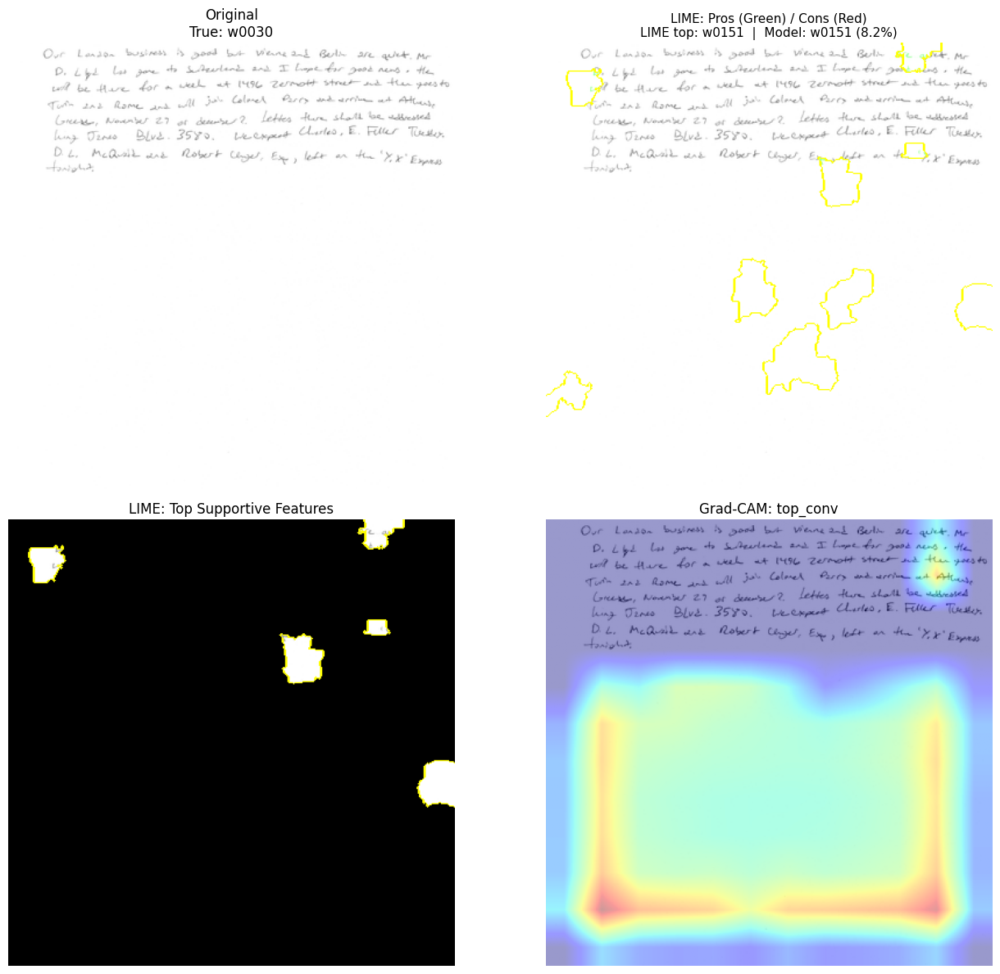

  0%|          | 0/500 [00:00<?, ?it/s]

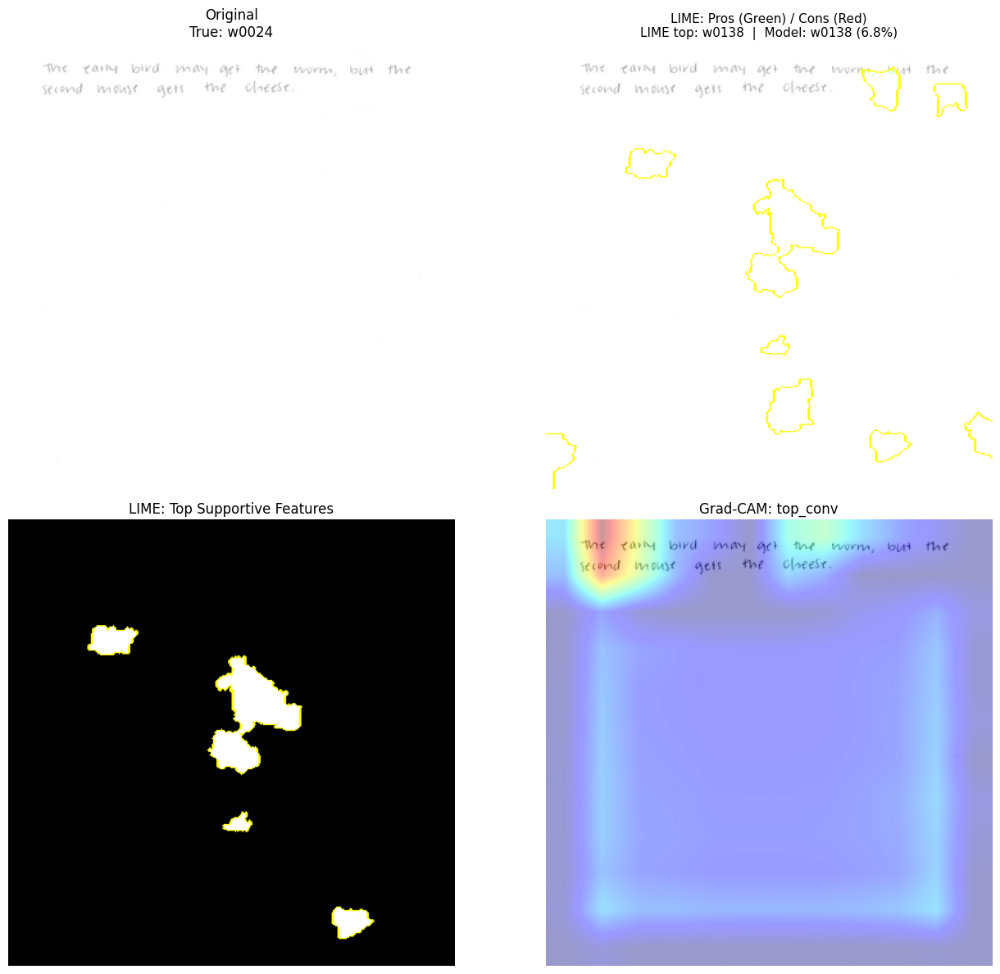

CPU times: user 45.7 s, sys: 4.28 s, total: 50 s
Wall time: 48.4 s


In [38]:
%%time
xai.plot_ultimate_explanation(test_ds,model,"top_conv")
xai.plot_ultimate_explanation(test_ds,model,"top_conv")
xai.plot_ultimate_explanation(test_ds,model,"top_conv")

  0%|          | 0/500 [00:00<?, ?it/s]

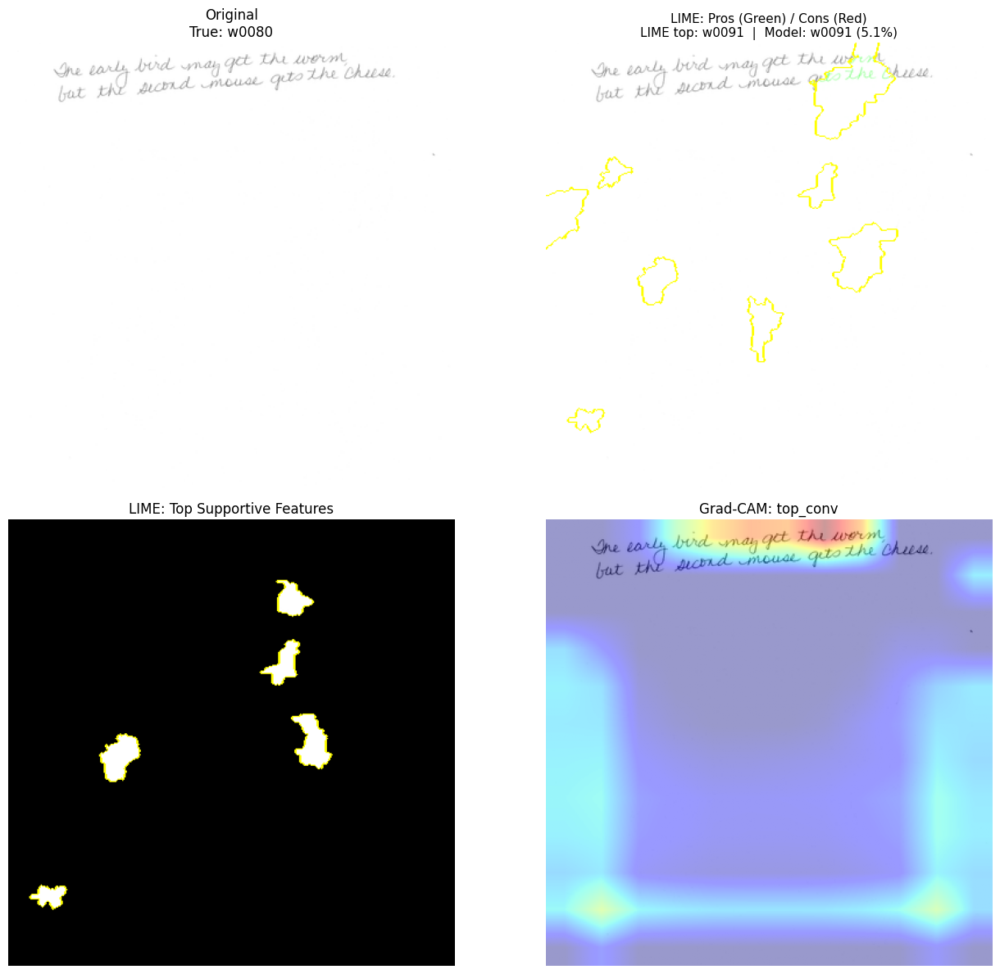

  0%|          | 0/500 [00:00<?, ?it/s]

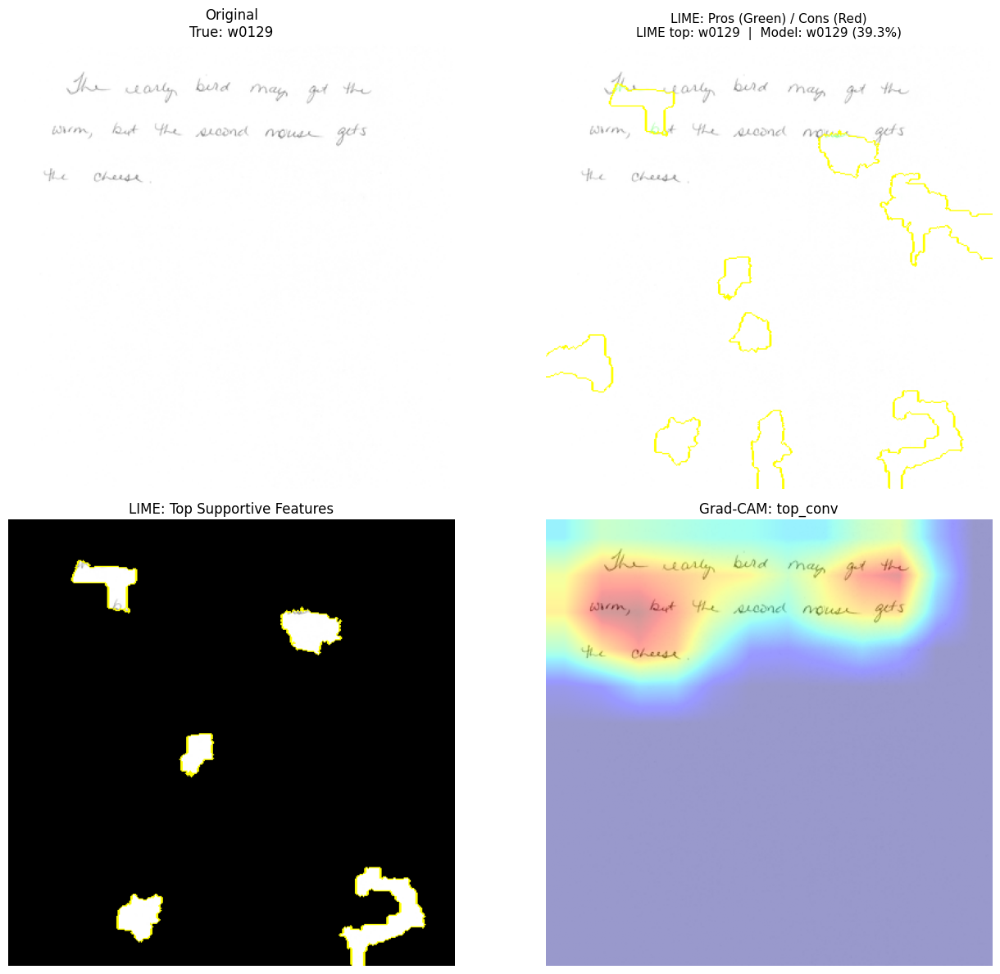

  0%|          | 0/500 [00:00<?, ?it/s]

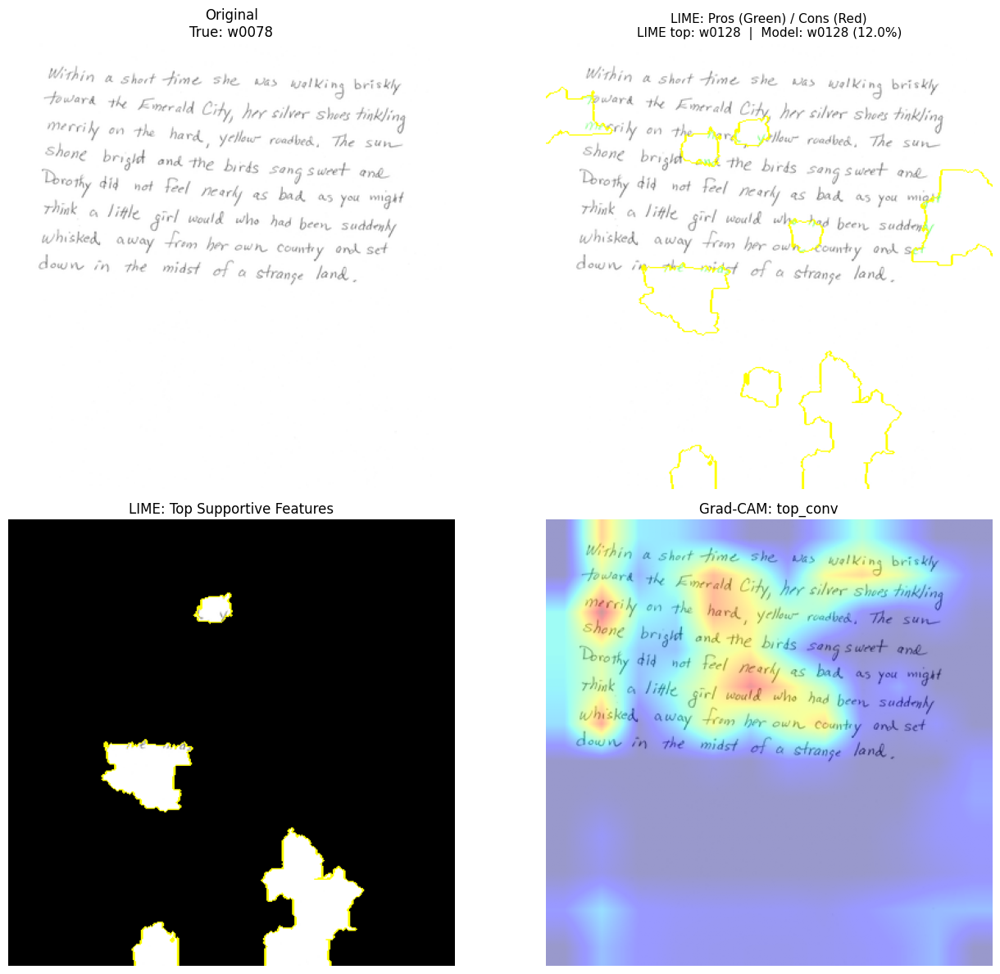

CPU times: user 45.4 s, sys: 6.89 s, total: 52.3 s
Wall time: 50.9 s


In [40]:
%%time
xai.plot_ultimate_explanation(test_ds,model,"top_conv")
xai.plot_ultimate_explanation(test_ds,model,"top_conv")
xai.plot_ultimate_explanation(test_ds,model,"top_conv")

In [39]:
! zip -rq eff+dense_90_testset.zip /content/New_Data/test